<h2 align="center">Paweł Kocimski </h2>
<h3 align="center">Metody Obliczeniowe w Nauce i Technice </h3>
<h4 align="center">Lab 13 Minimalizacja funkcji</h4>

<h6>1 Problem komiwojażera<h6>

Wygeneruj chmurę n losowych punktów w 2D, a następnie zastosuj algorytm symulowanego wyżarzania do przybliżonego rozwiązania problemu komiwojażera dla tych punktów.

In [97]:
import numpy as np
from matplotlib import pyplot as plt
import random


class Point:
    x: int
    y: int
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def distance_point(self, point):
        return np.sqrt((self.x -point.x)**2 + (self.y-point.y)**2)

    
def path_length(points):
    n = len(points)
    length = 0
    for i in range(n):
        length += points[i].distance_point(points[(i + 1) % n])
    return length



Funkcja plot służy do rysowania trasy

In [98]:
def plot(points):
    n = len(points)

    plt.figure(figsize=[10, 5])
    plt.subplot(1, 2, 1)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Path with connected first and last point")
    plt.plot( np.append([points[i].x for i in range(n)], points[0].x), np.append([points[i].y for i in range(n)], points[0].y),  "r")
    plt.plot( [points[i].x for i in range(n)],[points[i].y for i in range(n)] ,  "bo")

    plt.subplot(1, 2, 2)
    plt.plot( [points[i].x for i in range(n)] ,[points[i].y for i in range(n)] ,  "r")
    plt.plot( [points[i].x for i in range(n)] ,[points[i].y for i in range(n)],  "bo")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Path with not connected first and last point")
    plt.show()

    path_length(points)

Generowanie puktów znajdujących sie z pewną niedokładnością na okręgu

In [99]:
def generate_points(n):
    points_x = np.array([])
    points_y = np.array([])
    points = np.array([])
    np.random.seed(555)
    t = np.linspace(0,2*np.pi,n)
    xc = 3*np.random.rand() #x-coordinate of center of circle 
    yc = 3*np.random.rand() #y-coordinate of center of circle
    r = 2*np.random.rand() + 0.5 #radius of circle

    points_x = r*np.cos(t) + np.random.normal(scale = 1.0/7, size = len(t)) + xc  
    points_y = r*np.sin(t) + np.random.normal(scale = 1.0/7, size = len(t)) + yc
    
    for i in range(n):
        points = np.append(points, Point(points_x[i], points_y[i]))
  
    return points

W funkcji simmulated_annealing zastosowano 3 rodzaje zmiany pozycji punktu<br>
1.move_rand_point_to_rand_pos - przenosi punkt w wylosowane miejsce, a punkty znajdujące się od wyloswanego miejsca przenosi o 1 dalej<br>
2.cut_swap_cut_reverse_first - tnie trasę(w wylosowanym punkcie)w na 2 części robi rewers pierwsej list i łaczy je ponownie<br>
3.arbitrary_swap-zamienia pozycję dóch losowych punktów

Path was shortened. No of iteration = 3	No of shortening path = 1	 Length of path = 24.21


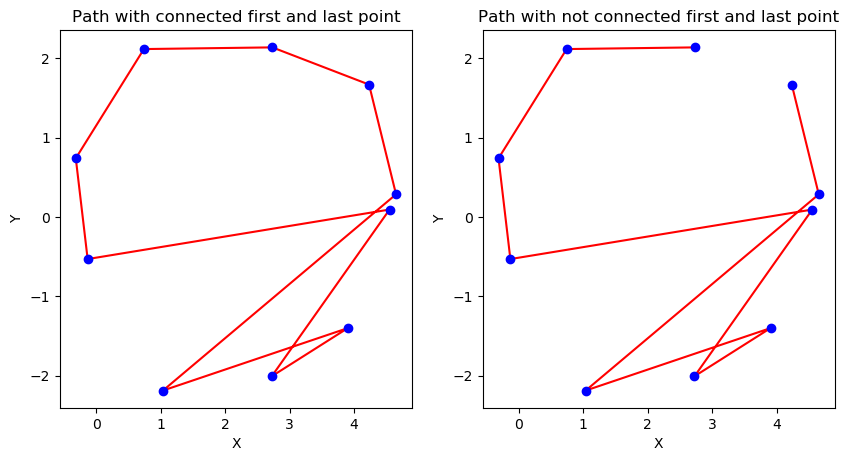

Path was shortened. No of iteration = 201	No of shortening path = 135	 Length of path = 22.12


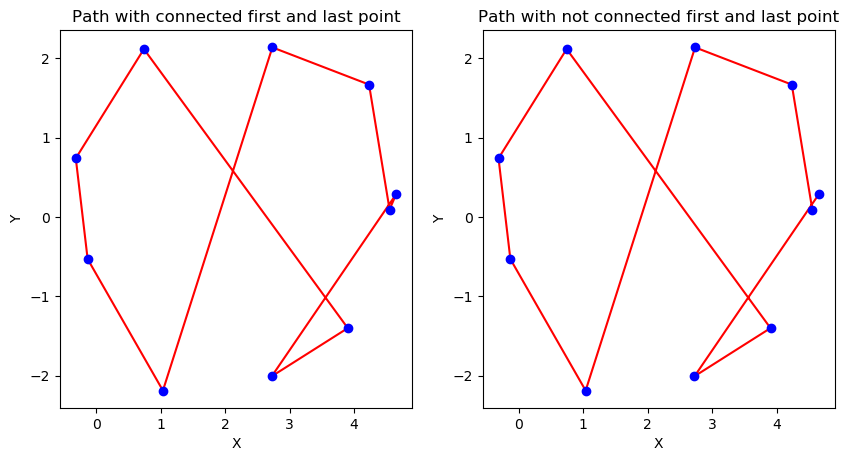

Path was shortened. No of iteration = 205	No of shortening path = 137	 Length of path = 21.75


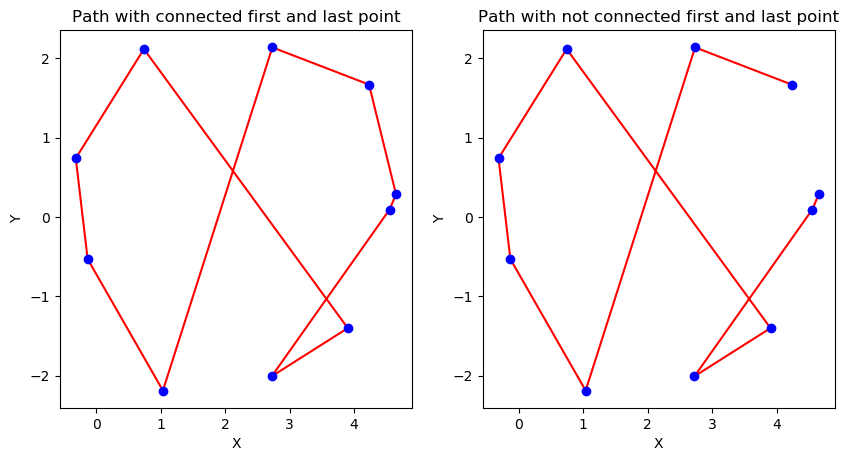

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: overflow encountered in exp


Path was shortened. No of iteration = 3238	No of shortening path = 1938	 Length of path = 18.86


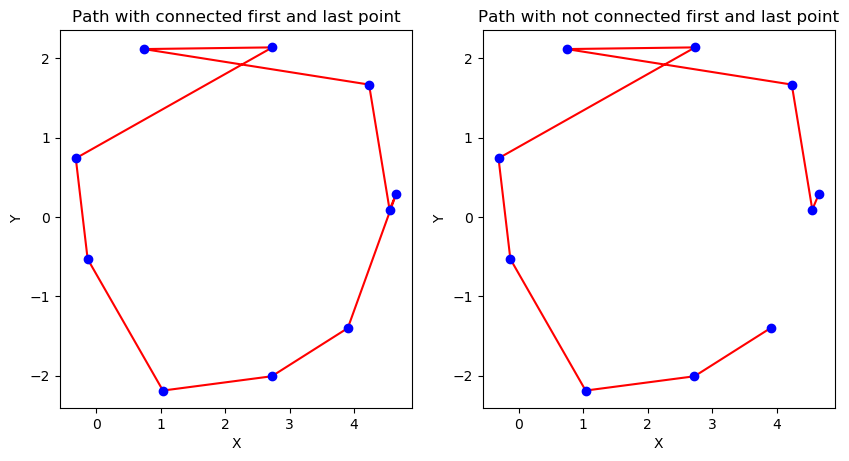

Path was shortened. No of iteration = 5709	No of shortening path = 3350	 Length of path = 18.23


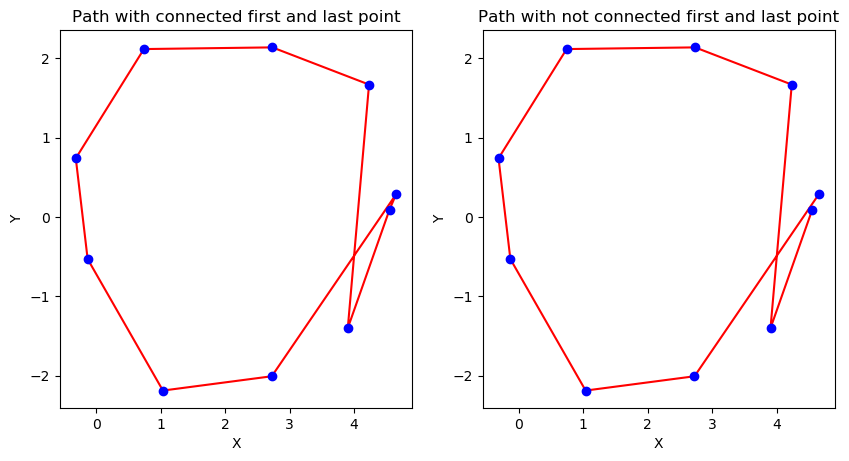

Path was shortened. No of iteration = 32463	No of shortening path = 18441	 Length of path = 17.95


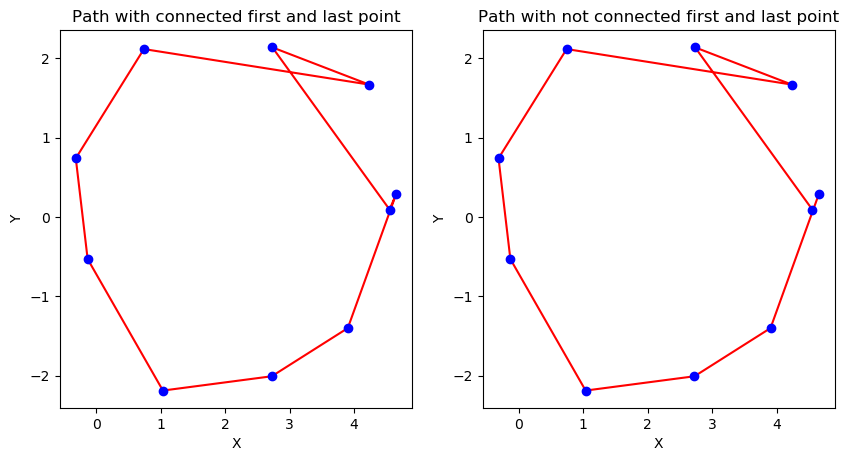

Path was shortened. No of iteration = 74829	No of shortening path = 42337	 Length of path = 14.92


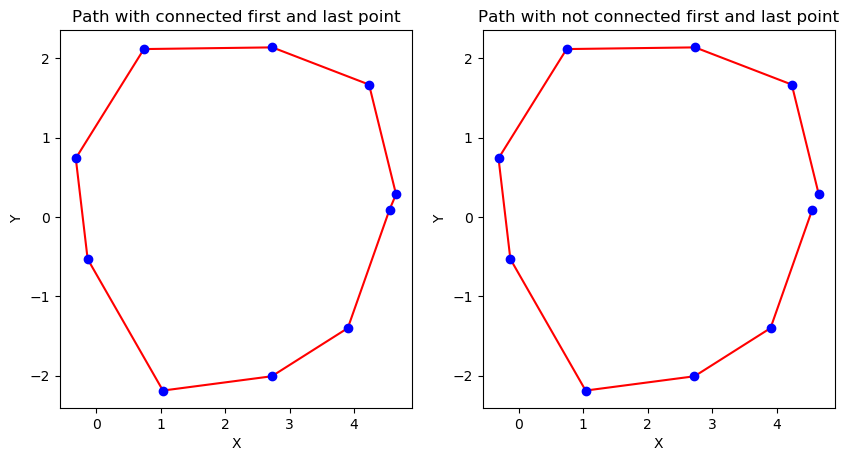

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: overflow encountered in double_scalars
/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in double_scalars


In [101]:
def move_rand_point_to_rand_pos(points):
    N = len(points)
    new_points = points[:]

    i = random.randint(1, N - 1)
    a = new_points[i]
    new_points = np.delete(new_points, i)

    j = random.randint(1, N - 2)
    new_points = np.insert(new_points, j, a)

    return new_points

def cut_swap_cut_reverse_first(points):
    n = len(points)

    i = random.randint(0, n / 2)
    c, d = np.split(points, [i])
    points = np.concatenate([d, c])

    i = random.randint(0, n / 2)
    c, d = np.split(points, [i])
    c = np.flip(c)
    new_points = np.concatenate([c, d])

    return new_points

def arbitrary_swap(points):
    n = len(points)

    i = random.randint(1, n - 1)
    j = random.randint(1, n - 1)
    points[i], points[j] = points[j], points[i]

    return points

#parametr beta is inverse temperature
def swap_simulated_annealing(points,beta, n_accept, best_energy):
    n = len(points)
    energy = path_length(points)
    new_path = False

    if n_accept >= 100 * np.log(n):
        beta *=1.005
        
    p = np.random.uniform(0.0, 1.0)
    if p < 0.2:
        new_points = cut_swap_cut_reverse_first(points)
    elif p < 0.6:
        new_points = move_rand_point_to_rand_pos(points)
    else:
        new_points = arbitrary_swap(points)

    new_energy = path_length(new_points)
    if random.uniform(0.0, 1.0) < np.exp(-beta * (new_energy - energy)):
        n_accept += 1
        energy = new_energy
        points = new_points[:]
        if energy < best_energy:
            best_energy = energy
            best_path = points[:]
            new_path = True

    return points, beta, n_accept, best_energy, new_path



def simulated_annealing(no_of_iter, points):

    energy_min = float('inf')
    beta = 1.0
    n_accept = 0
    iter = 0

    while iter < no_of_iter:
        new_points, beta, n_accept, energy_min, new_path = \
        swap_simulated_annealing(points[:], beta, n_accept, energy_min)
        if new_path:
            print("Path was shortened. No of iteration = %d\tNo of shortening path = %d\t Length of path = %4.2f"
                % (iter, n_accept, energy_min))
            plot(new_points)
        iter += 1


simulated_annealing(3*10e4, generate_points(10))

<h6>Wnioski</h6>
Funkcja dobrze wyznacza najkrótszą trasę lub czasami prawie najkrótszą

a) Przedstaw wizualizację otrzymanego rozwiązania dla 3 różnych wartości n oraz 3
różnych układów punktów w 2D (rozkład jednostajny, rozkład normalny z czterema
różnymi grupami parametrów, dziewięć odseparowanych grup punktów).

Path was shortened. No of iteration = 1	No of shortening path = 1	 Length of path = 52.58


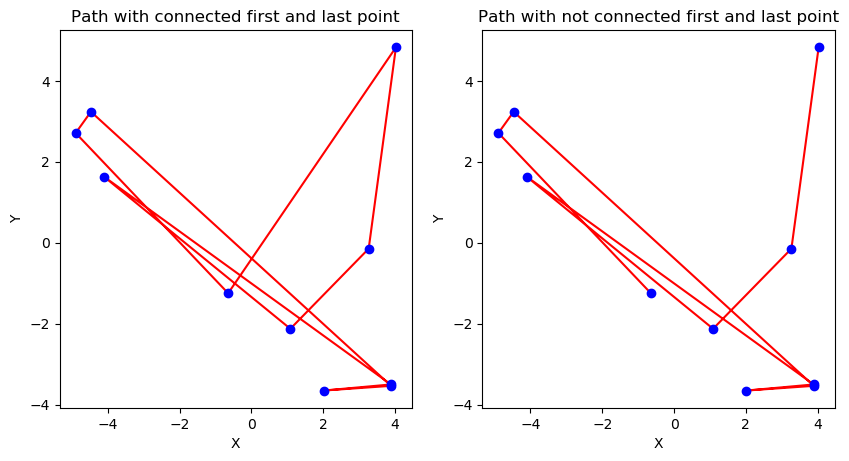

Path was shortened. No of iteration = 3	No of shortening path = 3	 Length of path = 46.31


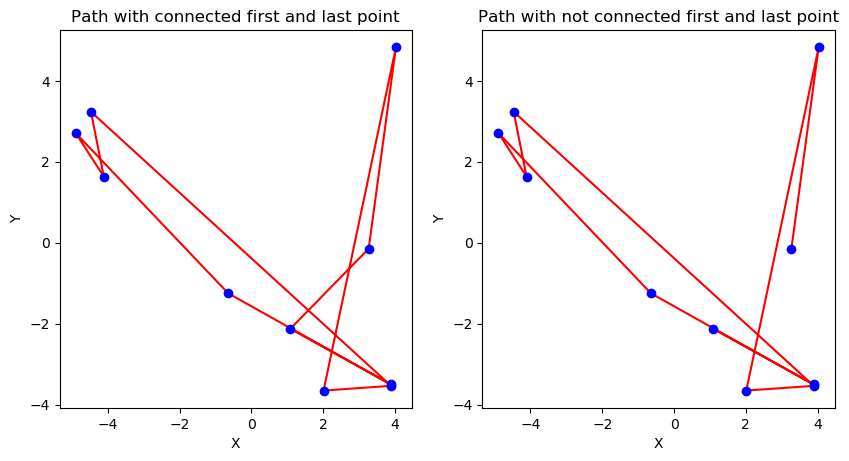

Path was shortened. No of iteration = 21	No of shortening path = 13	 Length of path = 45.91


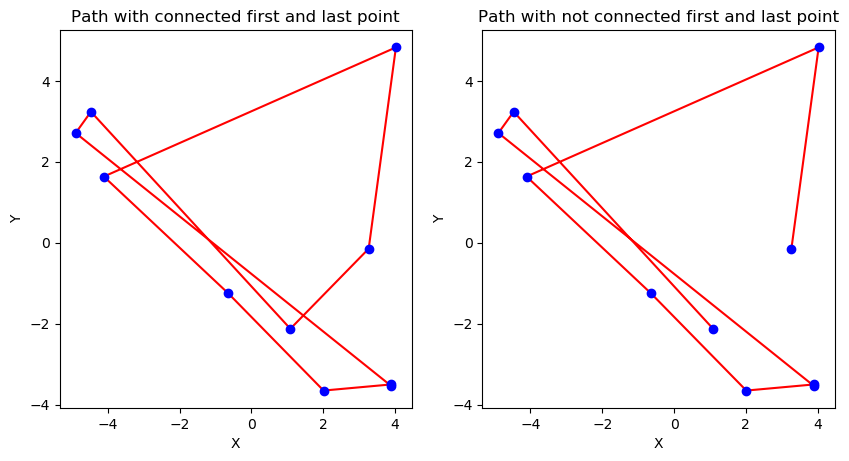

Path was shortened. No of iteration = 104	No of shortening path = 70	 Length of path = 41.20


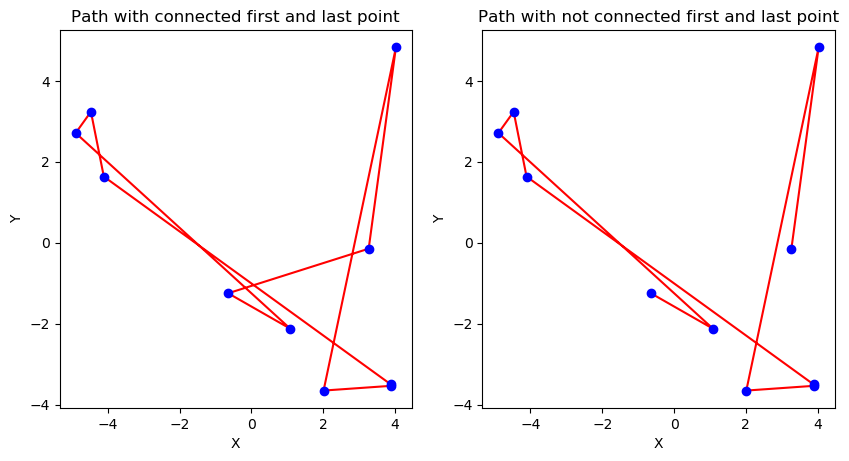

Path was shortened. No of iteration = 105	No of shortening path = 71	 Length of path = 37.10


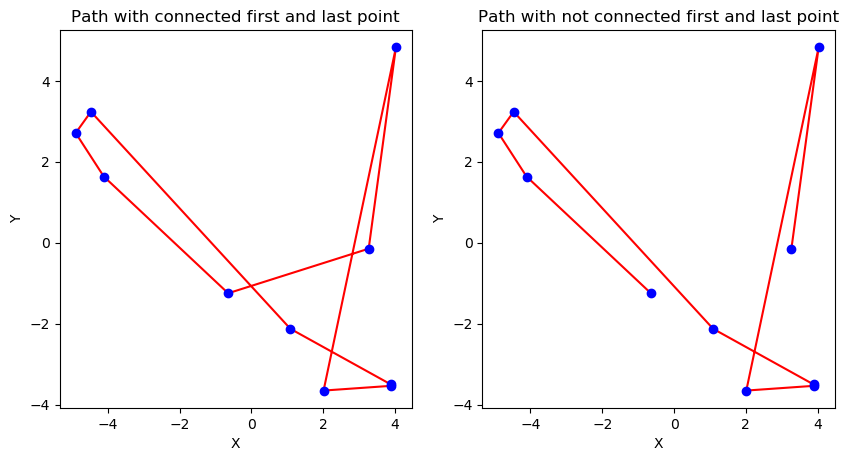

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:118: RuntimeWarning: overflow encountered in exp


Path was shortened. No of iteration = 1155	No of shortening path = 735	 Length of path = 36.68


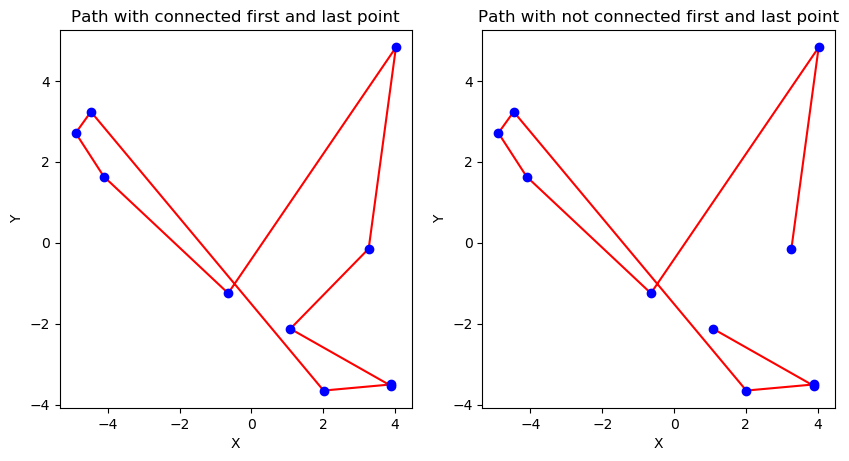

Path was shortened. No of iteration = 4212	No of shortening path = 2596	 Length of path = 36.63


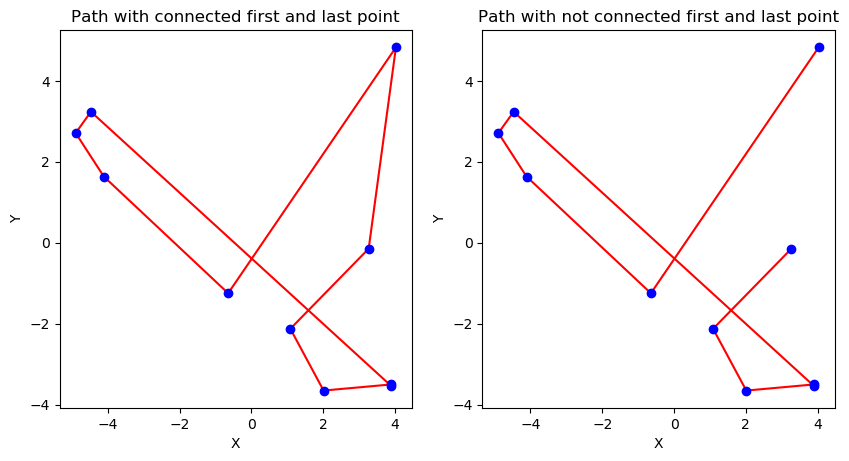

Path was shortened. No of iteration = 4214	No of shortening path = 2597	 Length of path = 33.41


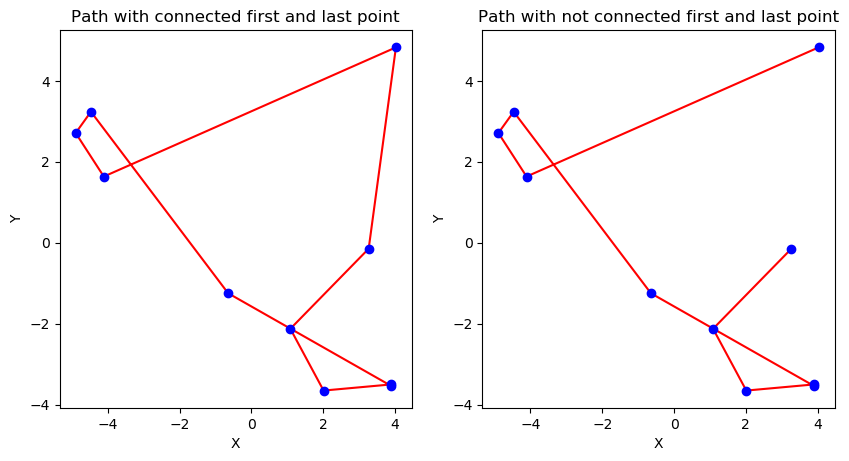

Path was shortened. No of iteration = 5119	No of shortening path = 3112	 Length of path = 31.75


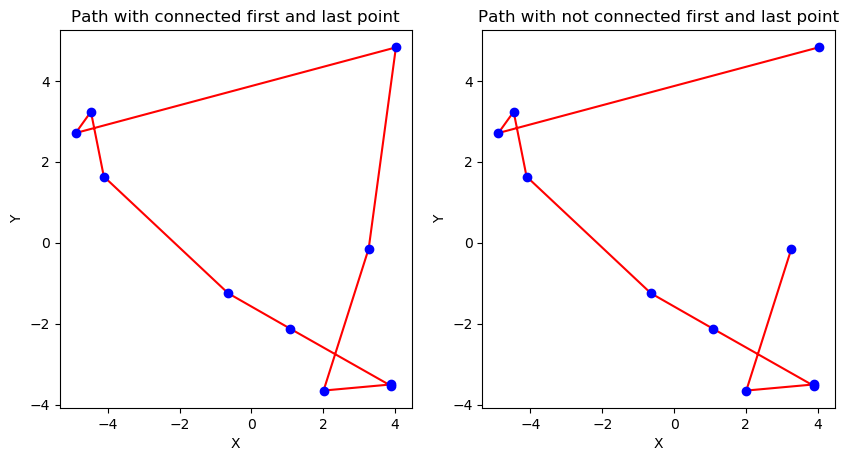

Path was shortened. No of iteration = 49772	No of shortening path = 28218	 Length of path = 31.52


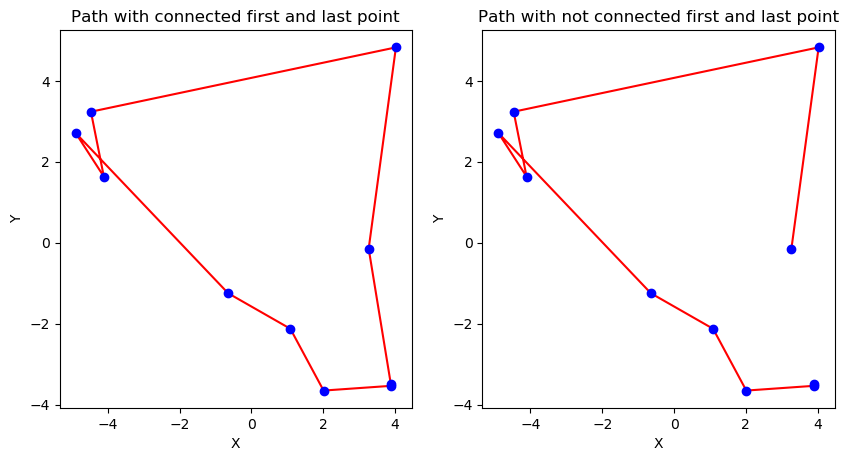

Path was shortened. No of iteration = 49775	No of shortening path = 28219	 Length of path = 31.52


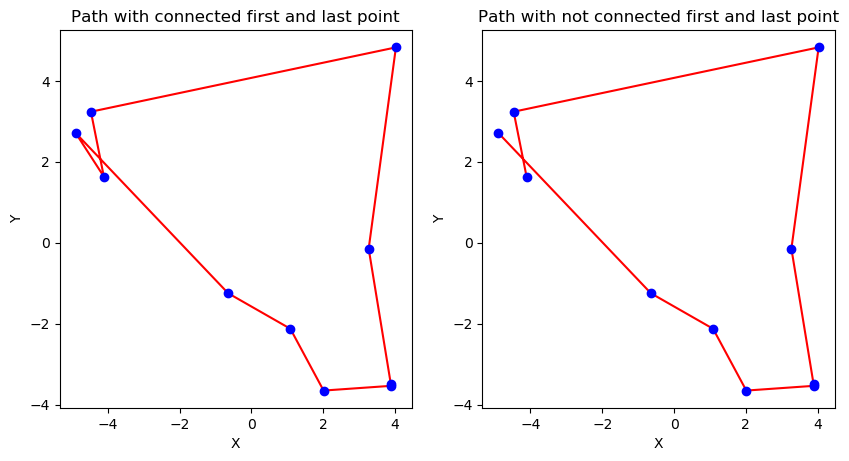

Path was shortened. No of iteration = 90112	No of shortening path = 50951	 Length of path = 30.90


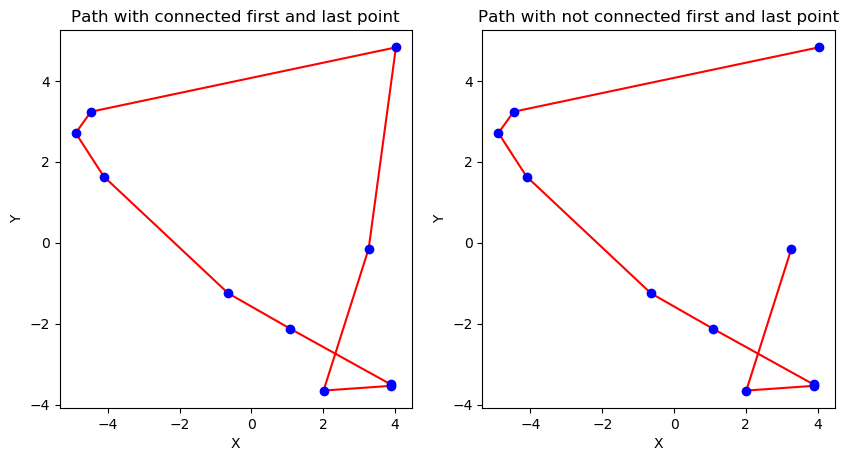

Path was shortened. No of iteration = 95517	No of shortening path = 54015	 Length of path = 30.77


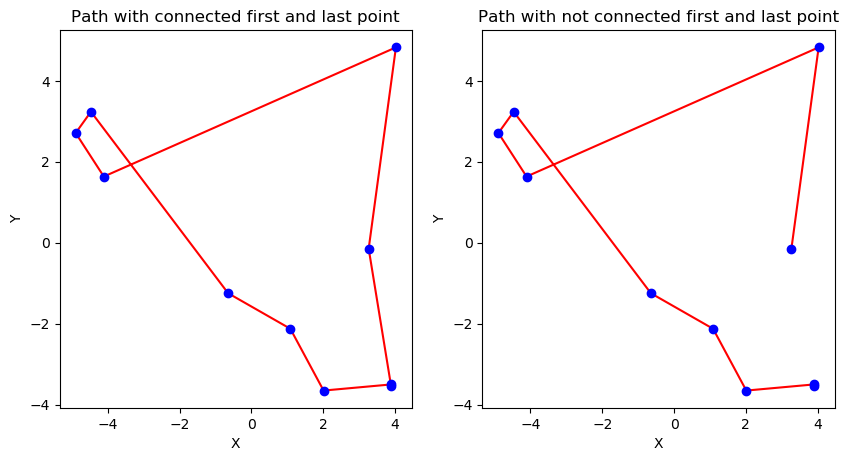

In [34]:
def generate_uniform_points(n, x_low, x_high, y_low, y_high):
    points_x = np.array([])
    points_y = np.array([])
    points = np.array([])

    points_x = np.append(points_x, np.random.uniform(low=x_low, high=x_high, size=n))
    points_y = np.append(points_y, np.random.uniform(low=y_low, high=y_high, size=n))

    for i in range(n):
        points = np.append(points, Point(points_x[i], points_y[i]))

    return points

simulated_annealing(10e4, generate_uniform_points(10, -5, 5, -5, 5))

Path was shortened. No of iteration = 1	No of shortening path = 1	 Length of path = 95.34


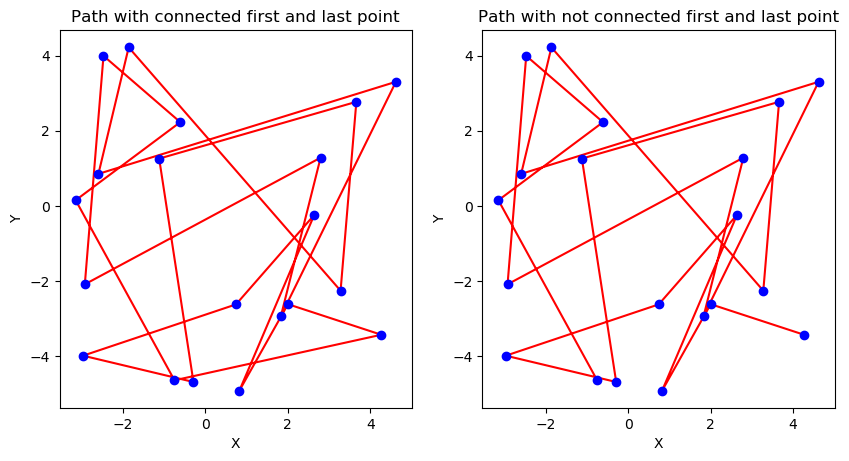

Path was shortened. No of iteration = 3	No of shortening path = 2	 Length of path = 94.94


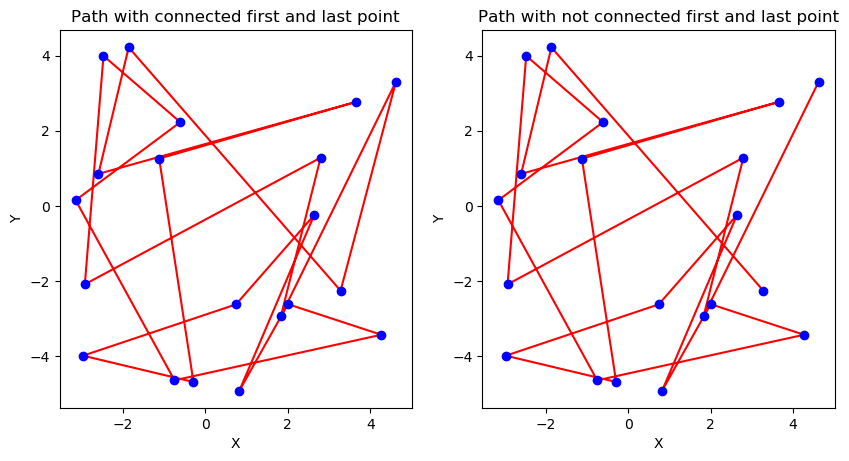

Path was shortened. No of iteration = 4	No of shortening path = 3	 Length of path = 88.45


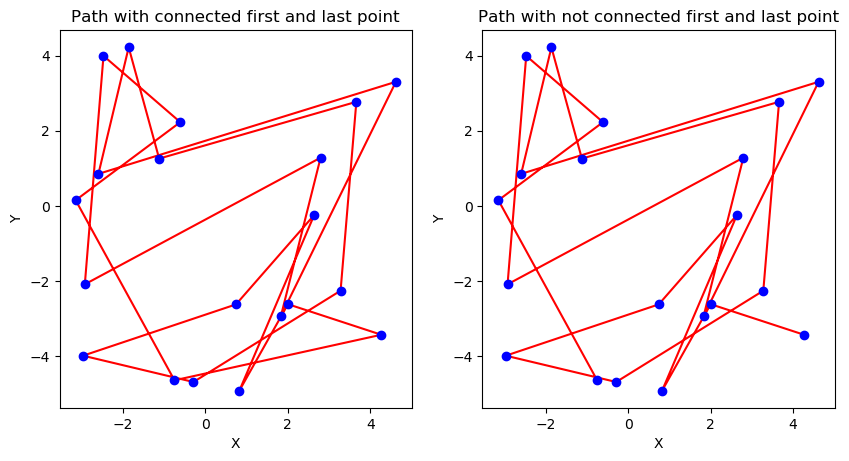

Path was shortened. No of iteration = 233	No of shortening path = 154	 Length of path = 88.13


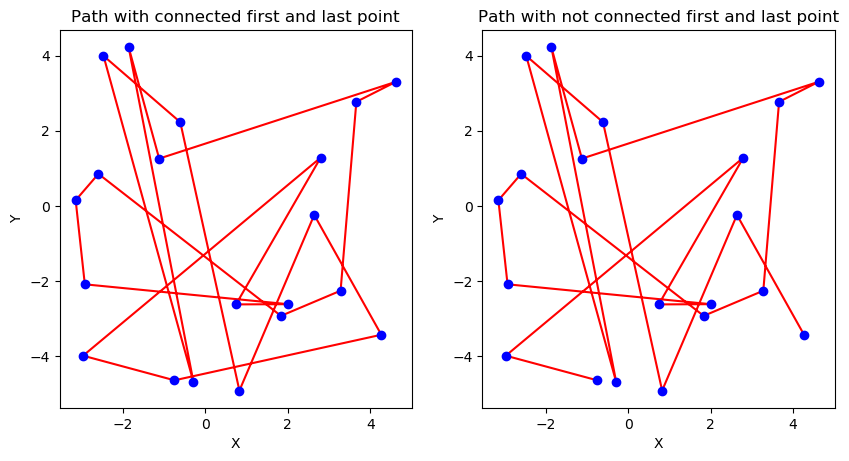

Path was shortened. No of iteration = 240	No of shortening path = 158	 Length of path = 84.85


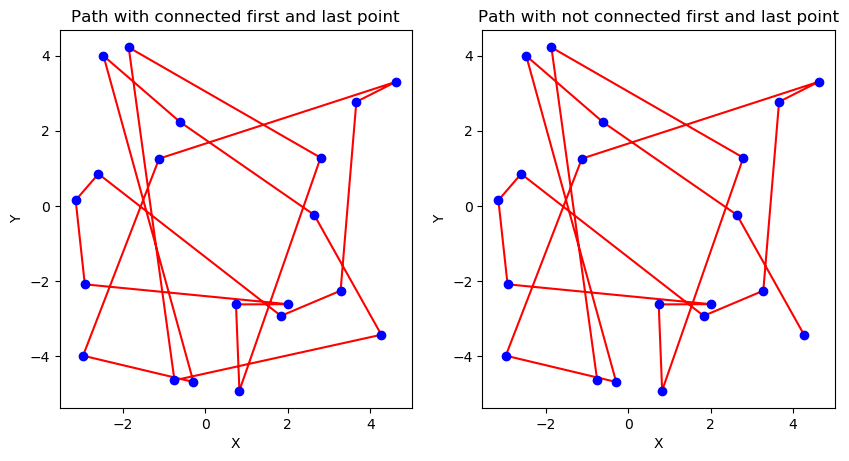

Path was shortened. No of iteration = 404	No of shortening path = 267	 Length of path = 84.13


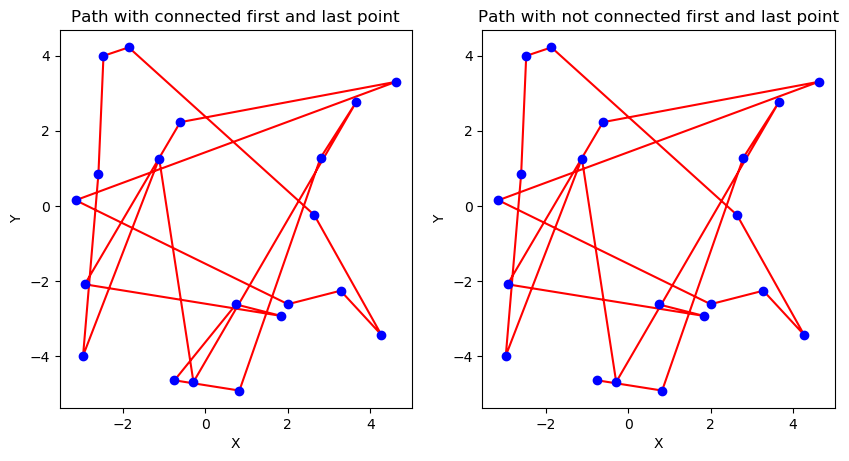

Path was shortened. No of iteration = 415	No of shortening path = 272	 Length of path = 82.42


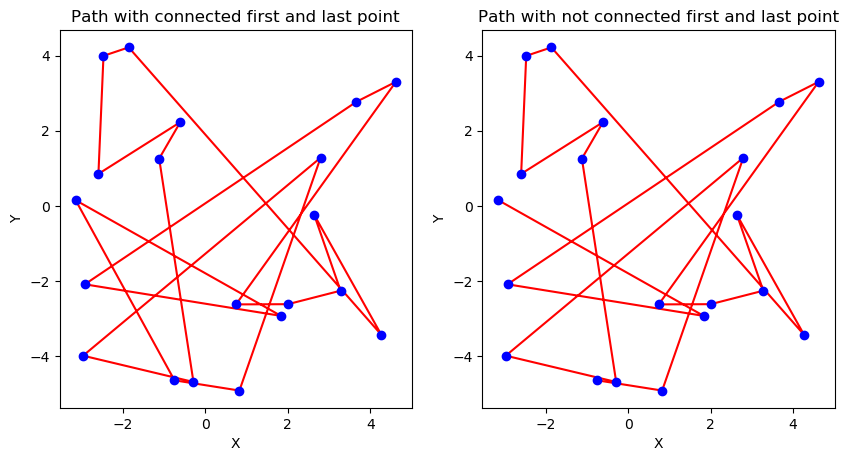

Path was shortened. No of iteration = 814	No of shortening path = 501	 Length of path = 82.03


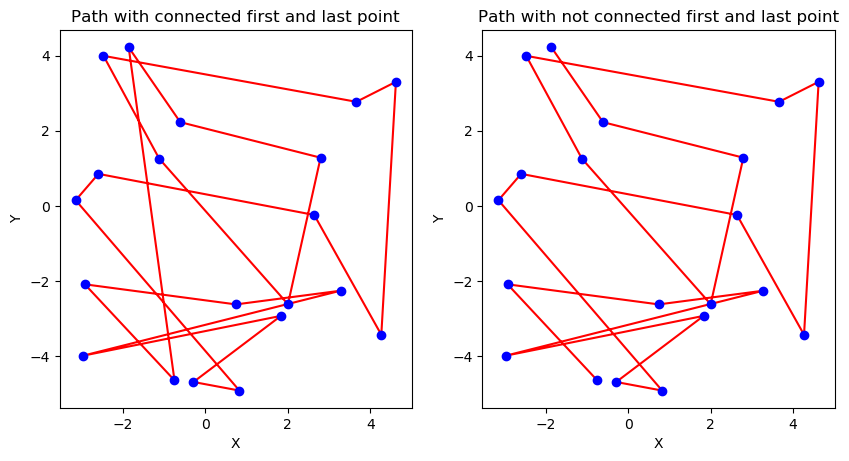

Path was shortened. No of iteration = 836	No of shortening path = 512	 Length of path = 77.19


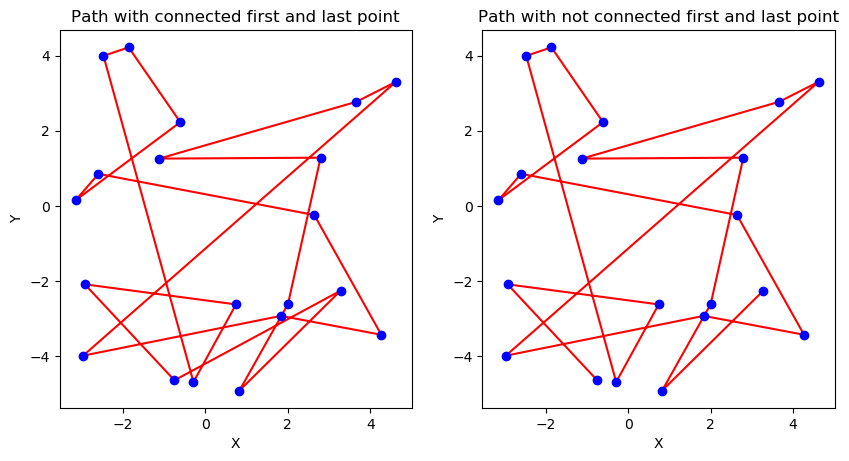

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:118: RuntimeWarning: overflow encountered in exp


Path was shortened. No of iteration = 1451	No of shortening path = 855	 Length of path = 73.13


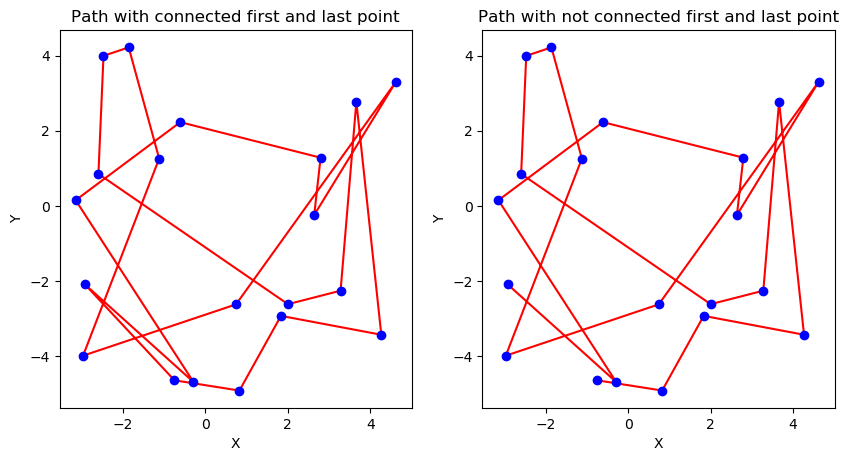

Path was shortened. No of iteration = 1456	No of shortening path = 857	 Length of path = 66.77


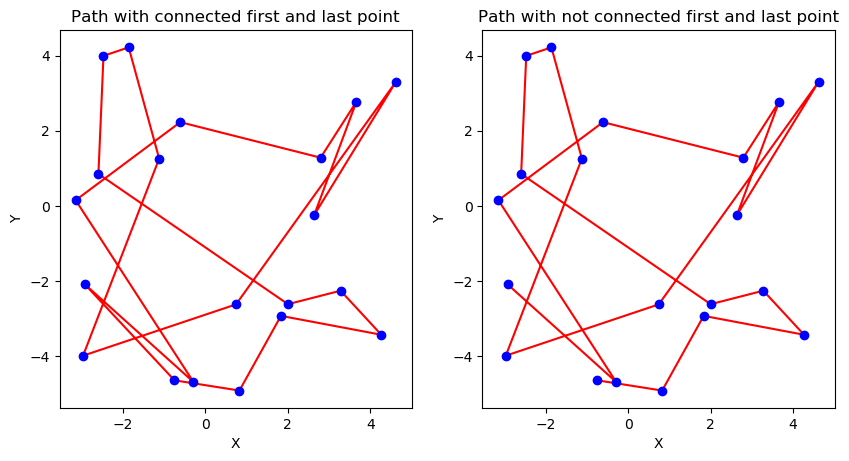

Path was shortened. No of iteration = 25285	No of shortening path = 13640	 Length of path = 66.73


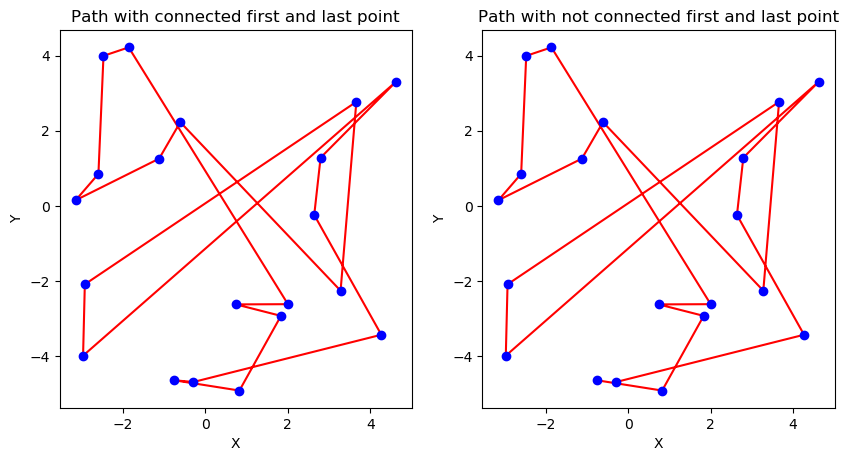

Path was shortened. No of iteration = 29723	No of shortening path = 15989	 Length of path = 64.87


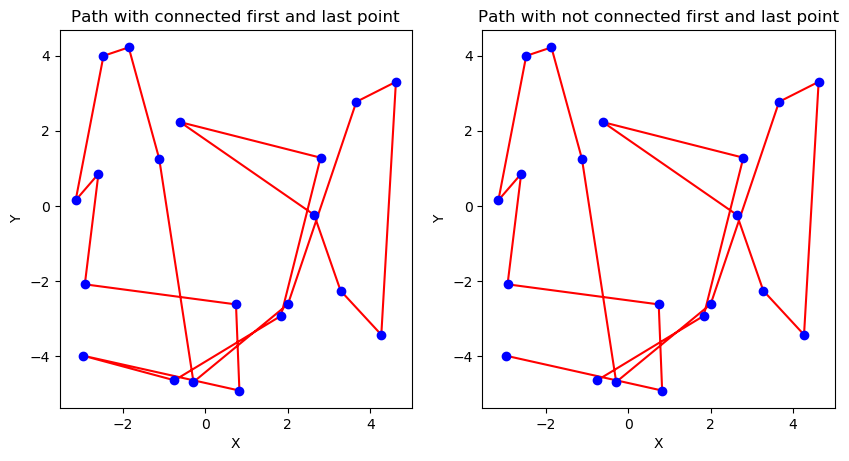

In [35]:
simulated_annealing(10e4, generate_uniform_points(20, -5, 5, -5, 5))

Path was shortened. No of iteration = 0	No of shortening path = 1	 Length of path = 160.45


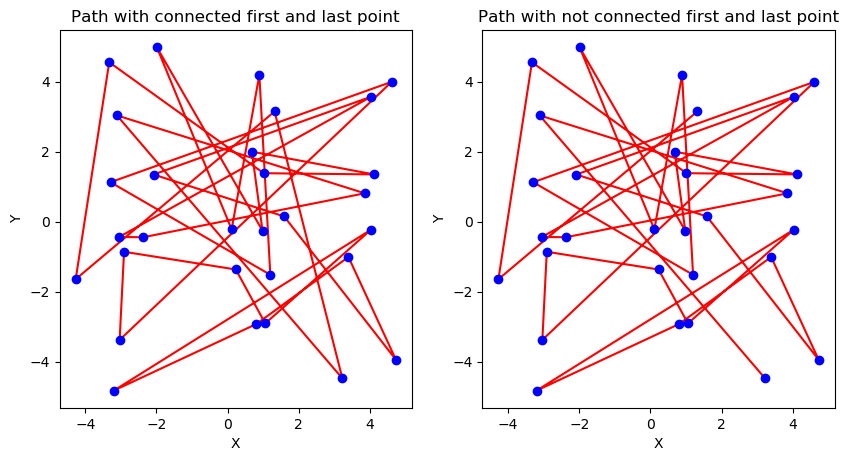

Path was shortened. No of iteration = 1	No of shortening path = 2	 Length of path = 158.97


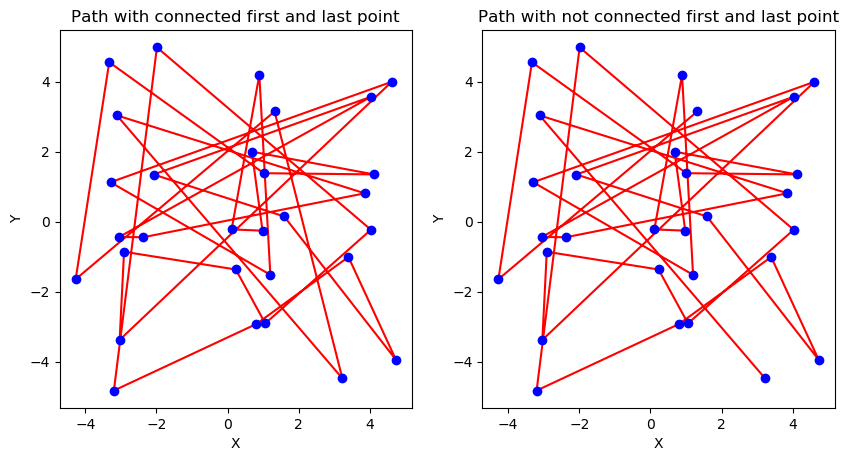

Path was shortened. No of iteration = 13	No of shortening path = 12	 Length of path = 154.00


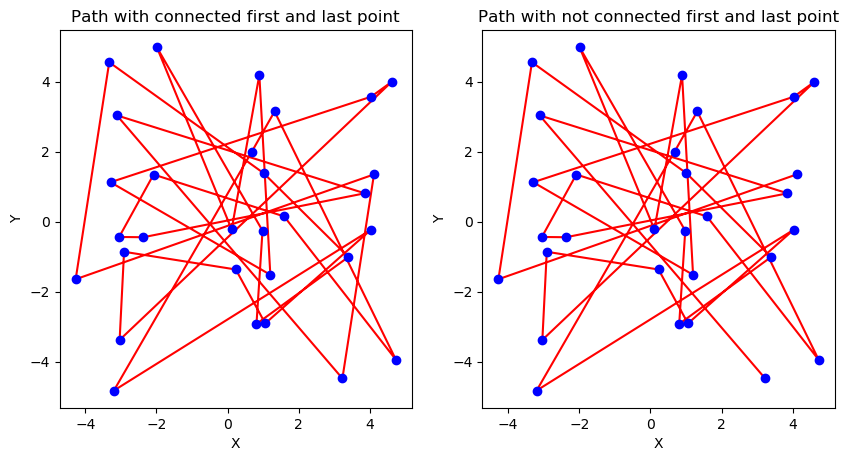

Path was shortened. No of iteration = 34	No of shortening path = 26	 Length of path = 153.91


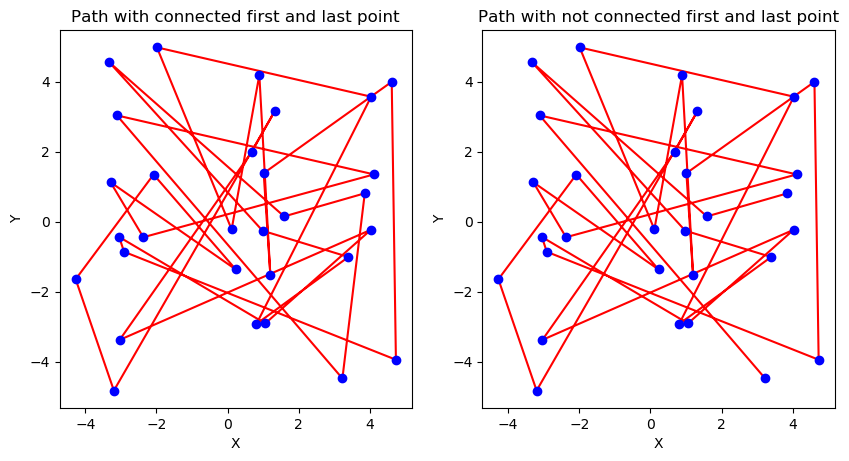

Path was shortened. No of iteration = 37	No of shortening path = 28	 Length of path = 149.68


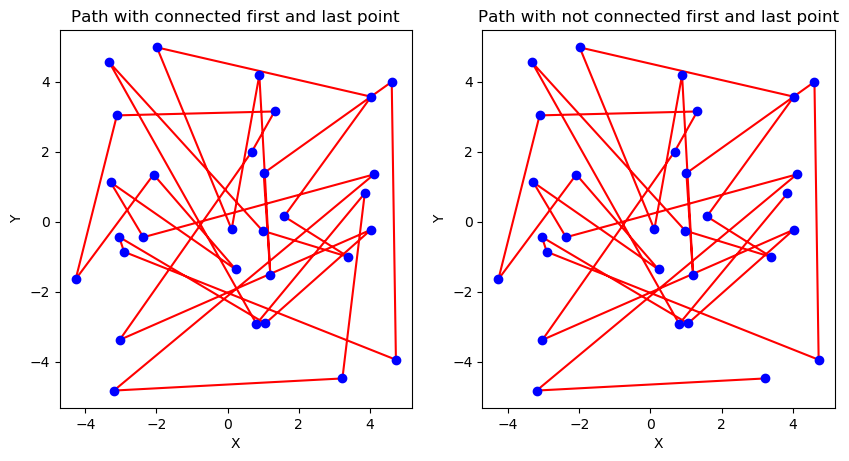

Path was shortened. No of iteration = 43	No of shortening path = 32	 Length of path = 145.54


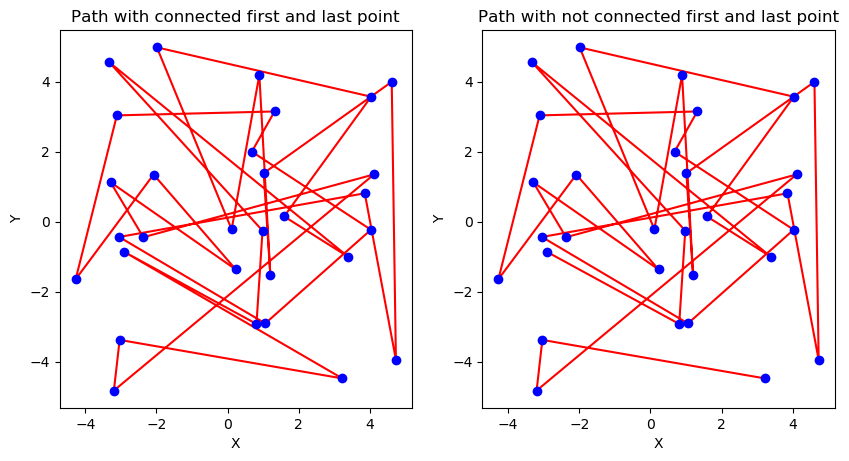

Path was shortened. No of iteration = 129	No of shortening path = 85	 Length of path = 140.32


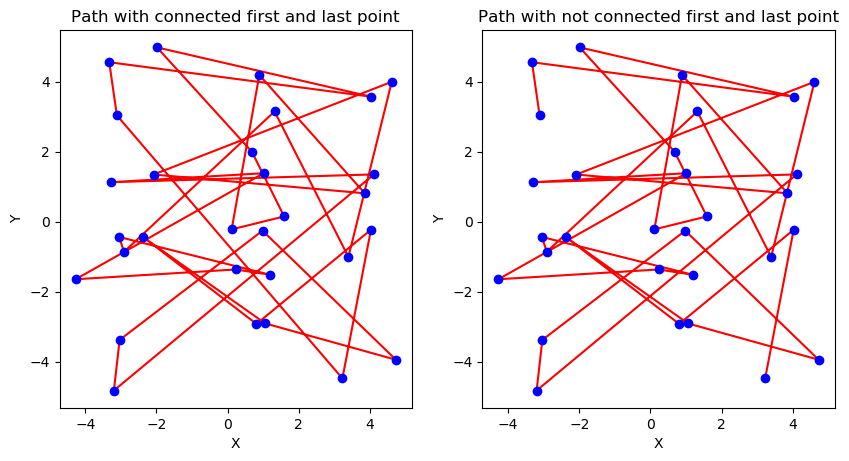

Path was shortened. No of iteration = 159	No of shortening path = 104	 Length of path = 139.71


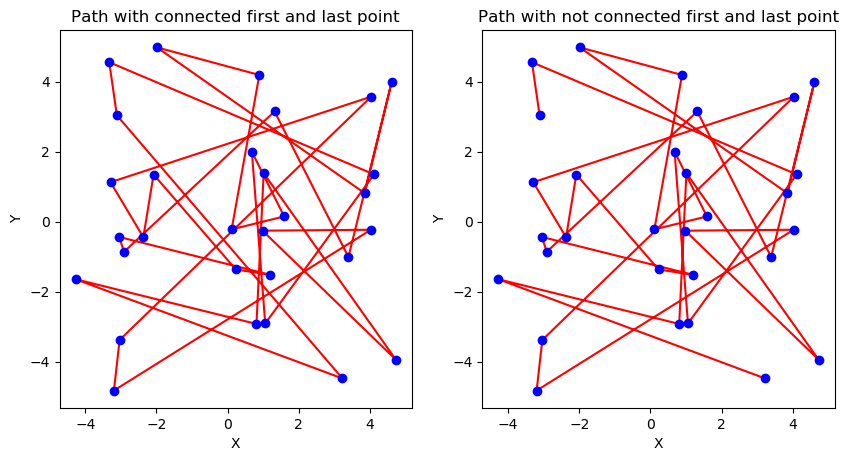

Path was shortened. No of iteration = 216	No of shortening path = 135	 Length of path = 139.42


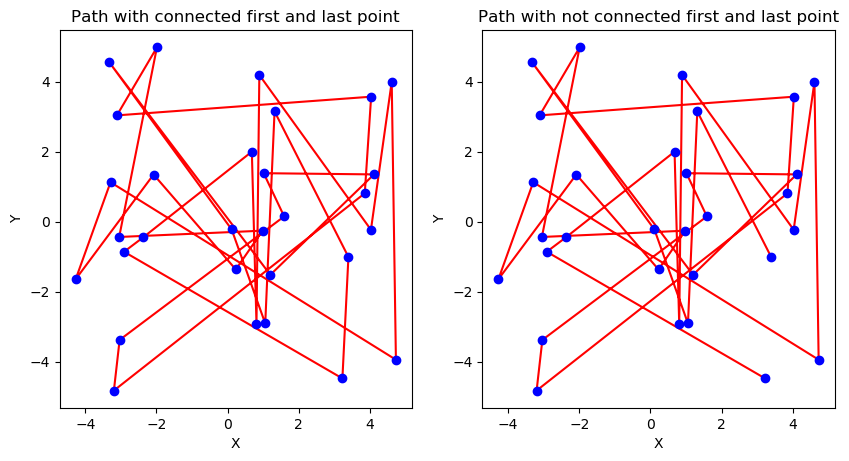

Path was shortened. No of iteration = 220	No of shortening path = 138	 Length of path = 137.39


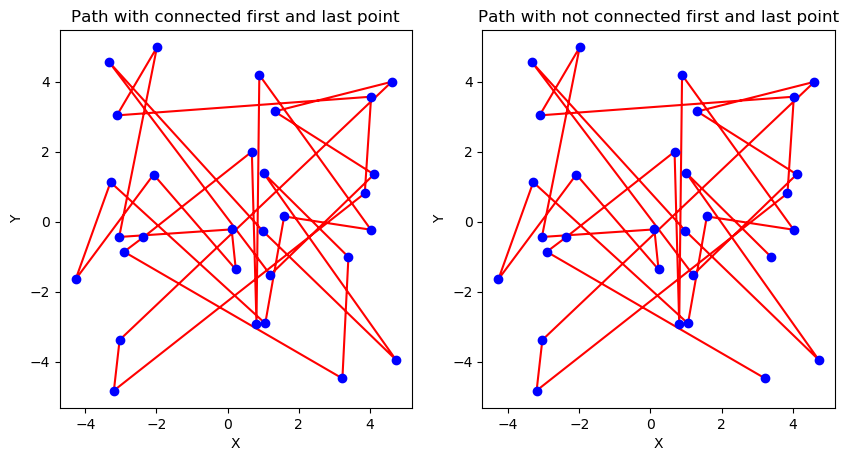

Path was shortened. No of iteration = 406	No of shortening path = 263	 Length of path = 130.19


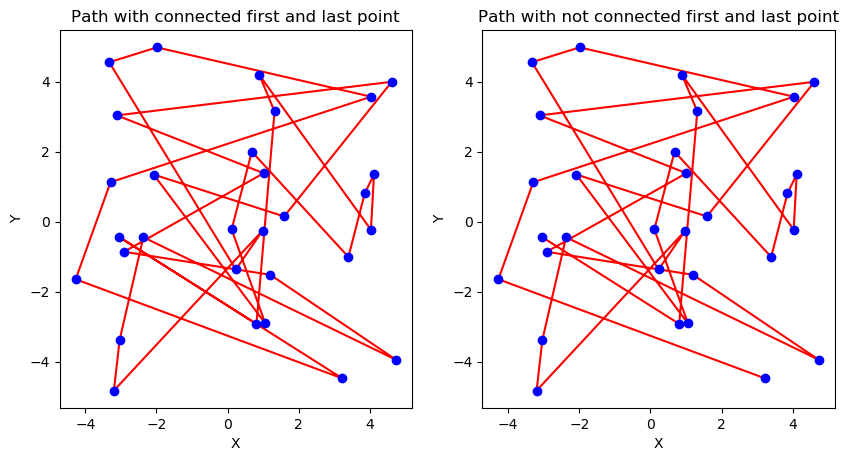

Path was shortened. No of iteration = 726	No of shortening path = 465	 Length of path = 124.72


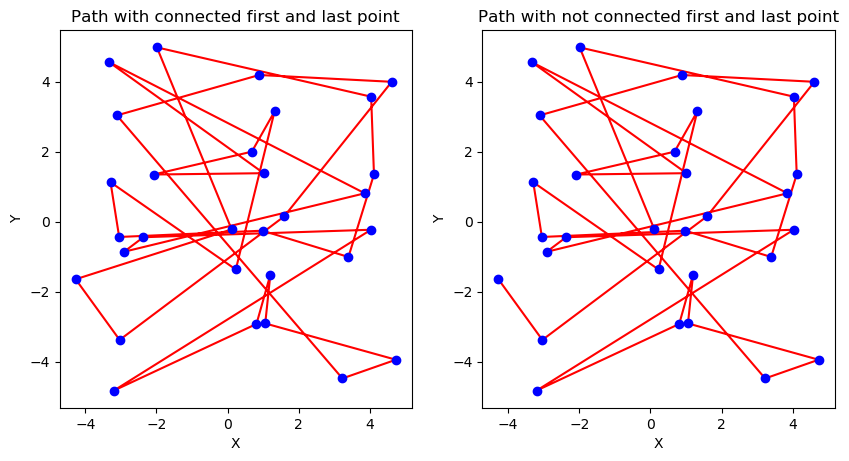

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:118: RuntimeWarning: overflow encountered in exp


Path was shortened. No of iteration = 2792	No of shortening path = 1547	 Length of path = 123.38


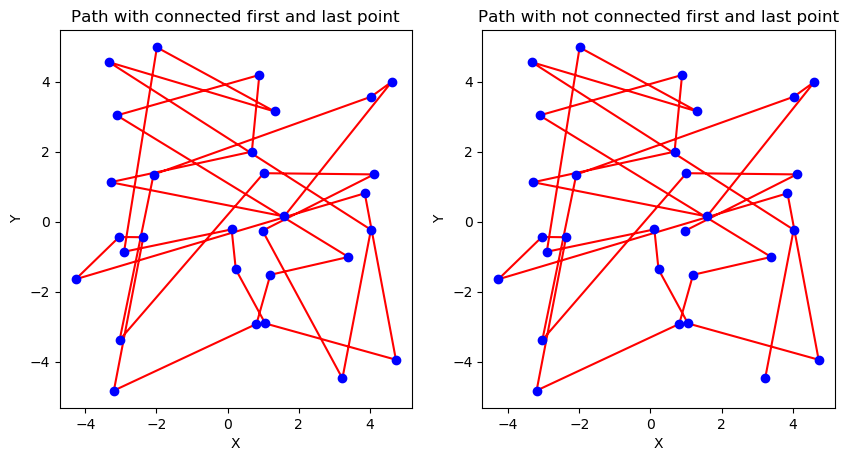

Path was shortened. No of iteration = 3522	No of shortening path = 1937	 Length of path = 122.26


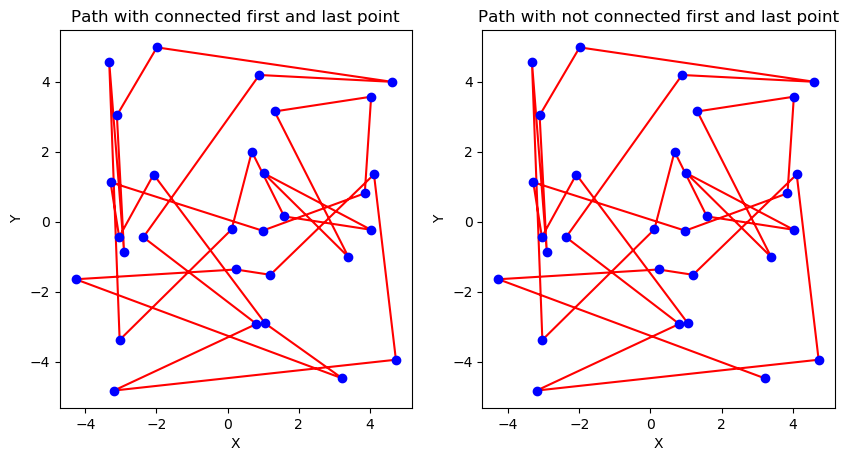

Path was shortened. No of iteration = 5432	No of shortening path = 2971	 Length of path = 118.32


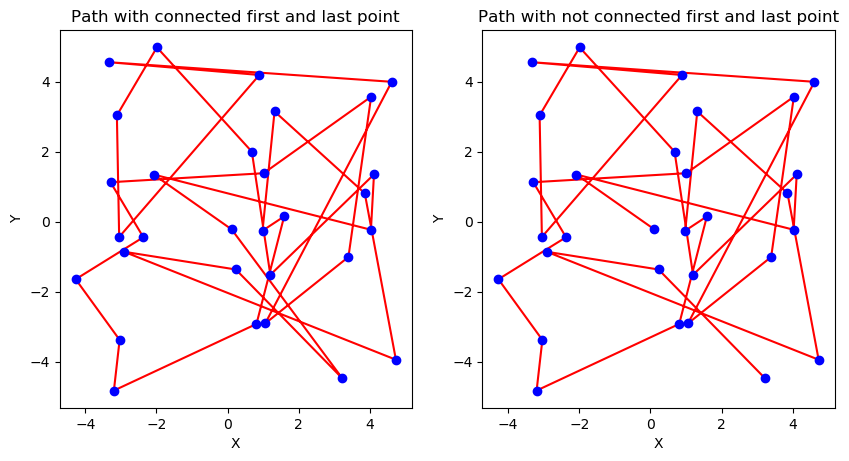

Path was shortened. No of iteration = 7844	No of shortening path = 4236	 Length of path = 117.53


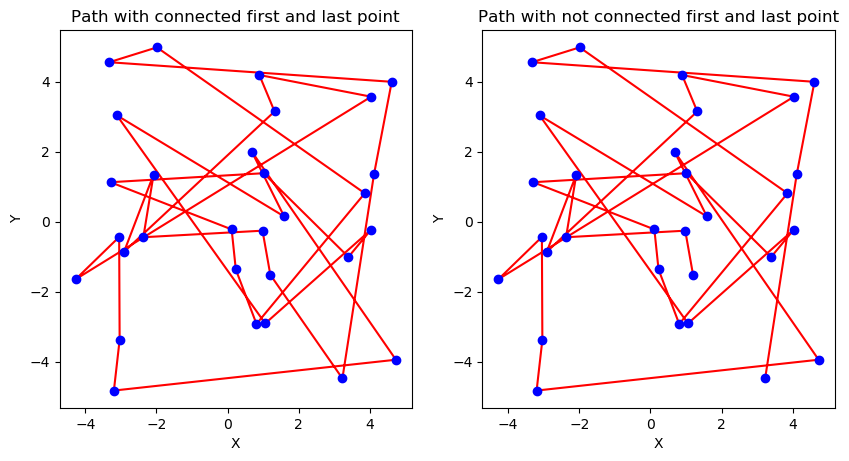

Path was shortened. No of iteration = 9311	No of shortening path = 4977	 Length of path = 110.74


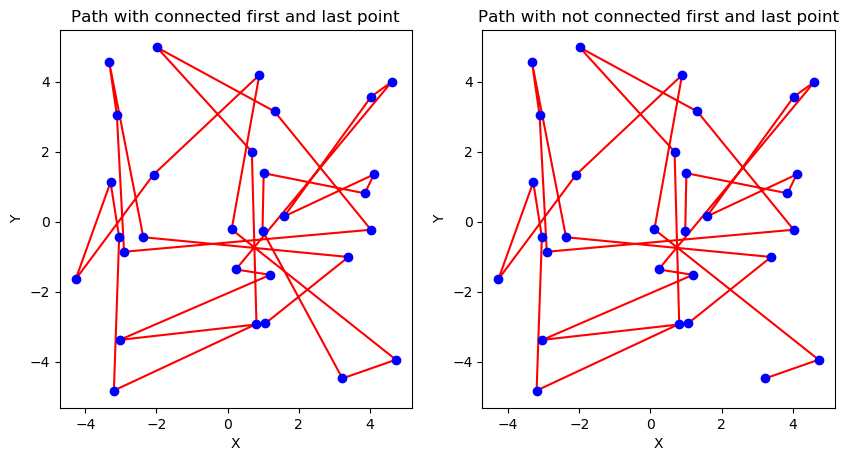

Path was shortened. No of iteration = 9312	No of shortening path = 4978	 Length of path = 106.85


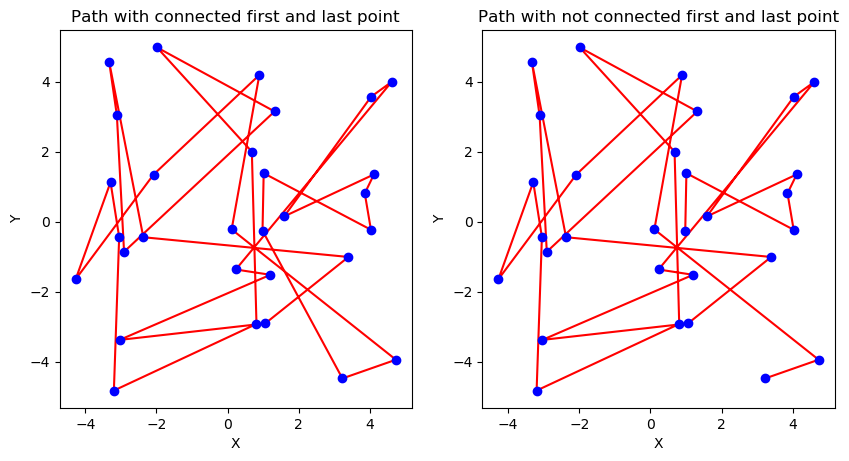

In [36]:
simulated_annealing(10e4, generate_uniform_points(30, -5, 5, -5, 5))

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: covariance is not positive-semidefinite.
  This is separate from the ipykernel package so we can avoid doing imports until


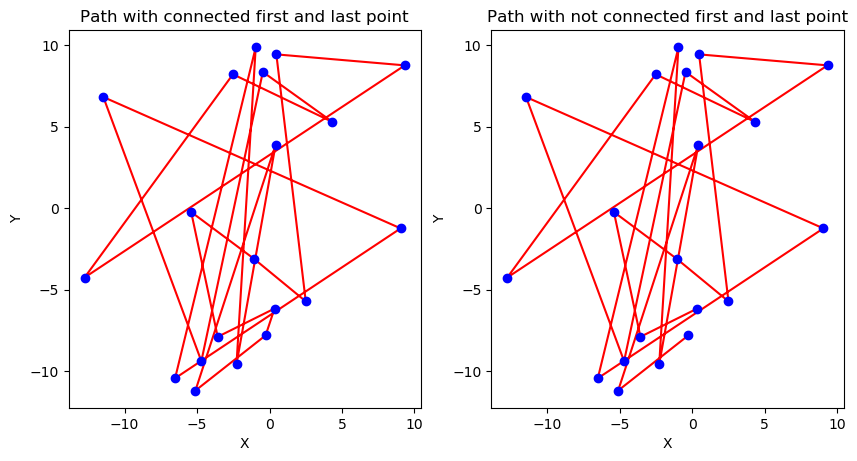

In [102]:
def generate_gauss_points(n, a, b ,c, d):
    points = np.array([])
    points_x, points_y = np.random.multivariate_normal([0,0], [[a, b], [c, d]], n).T
    for i in range(n):
        points = np.append(points, Point(points_x[i], points_y[i]))

    return points


plot(generate_gauss_points(20, 14, 77, 45, 5))

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: covariance is not positive-semidefinite.
  This is separate from the ipykernel package so we can avoid doing imports until


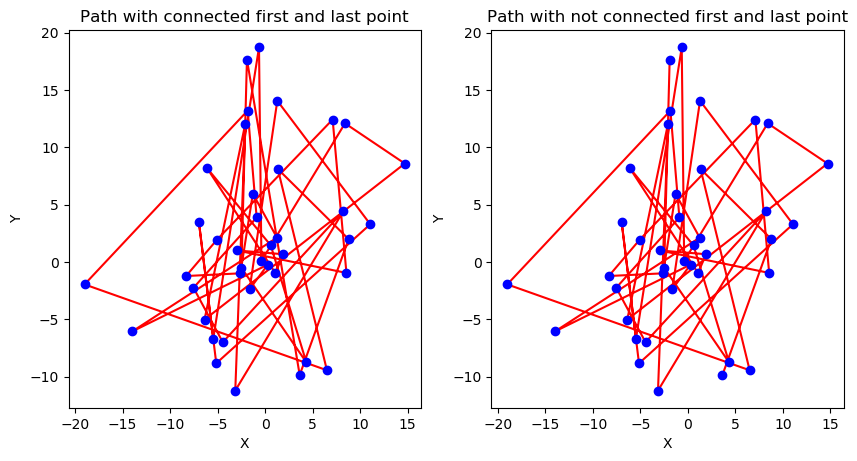

In [103]:
def group_gauss(n):
    points = generate_gauss_points(n, 14, 77, 45, 5)
    points = np.append(points, generate_gauss_points(n, 25, 74, 87, 98))
    points = np.append(points, generate_gauss_points(n, 56, 19, 20, 28))
    points = np.append(points, generate_gauss_points(n, 70, 15, 0, 60))
    return points

plot(group_gauss(10))

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: covariance is not positive-semidefinite.
  This is separate from the ipykernel package so we can avoid doing imports until


Path was shortened. No of iteration = 0	No of shortening path = 1	 Length of path = 502.10


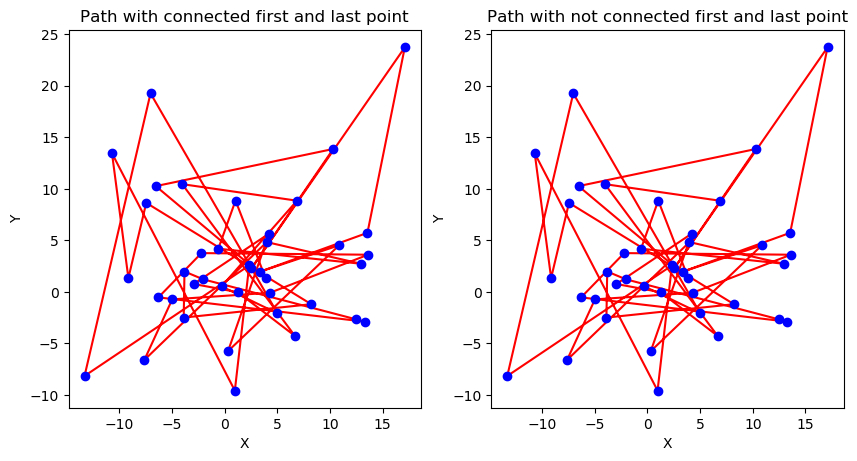

Path was shortened. No of iteration = 2	No of shortening path = 2	 Length of path = 500.98


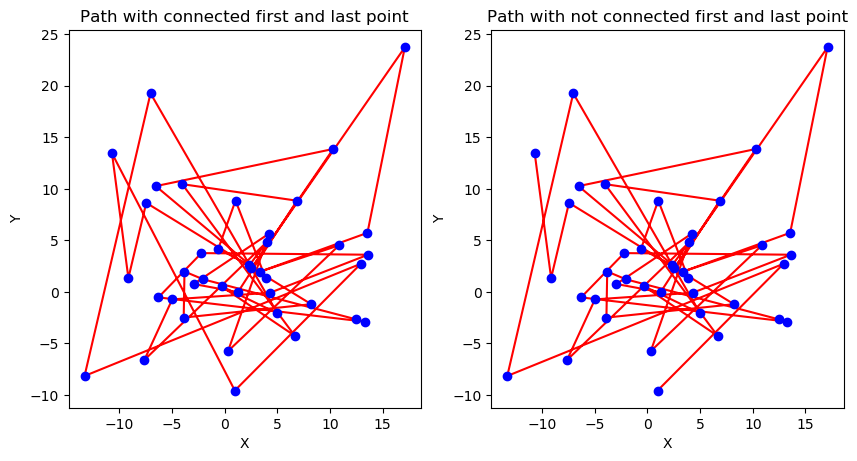

Path was shortened. No of iteration = 3	No of shortening path = 3	 Length of path = 497.10


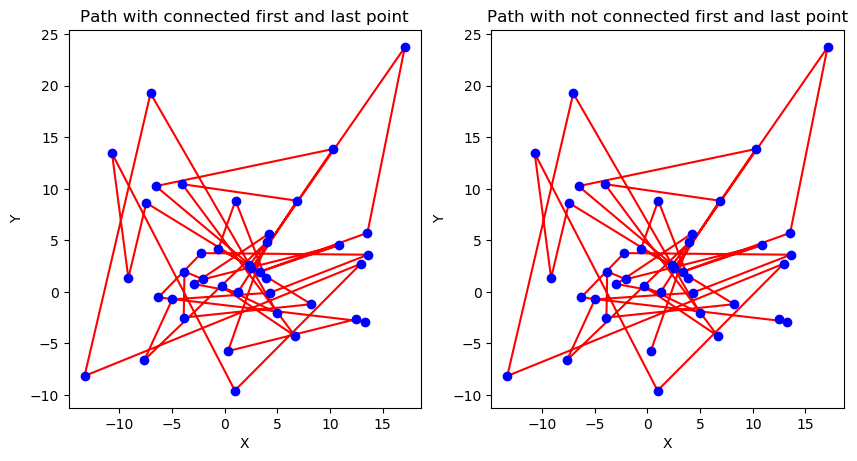

Path was shortened. No of iteration = 34	No of shortening path = 21	 Length of path = 496.66


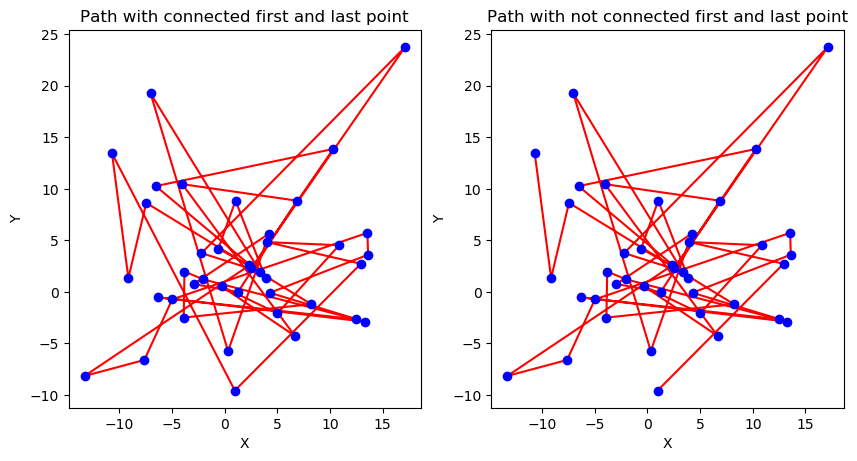

Path was shortened. No of iteration = 35	No of shortening path = 22	 Length of path = 470.27


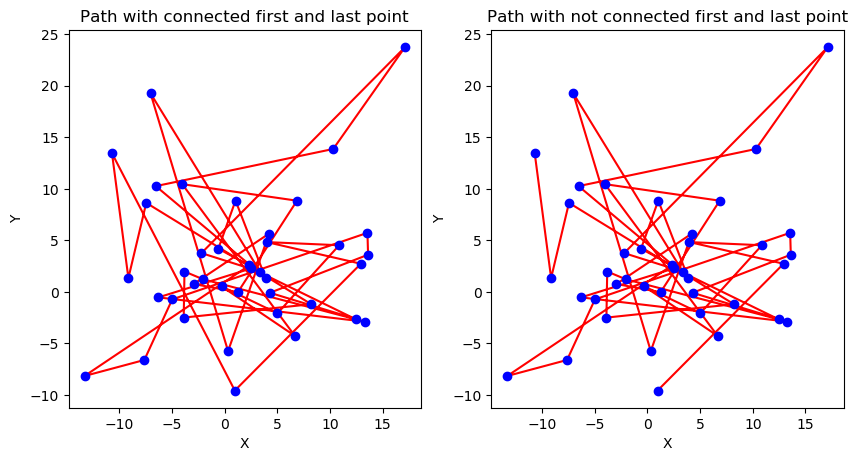

Path was shortened. No of iteration = 53	No of shortening path = 36	 Length of path = 469.69


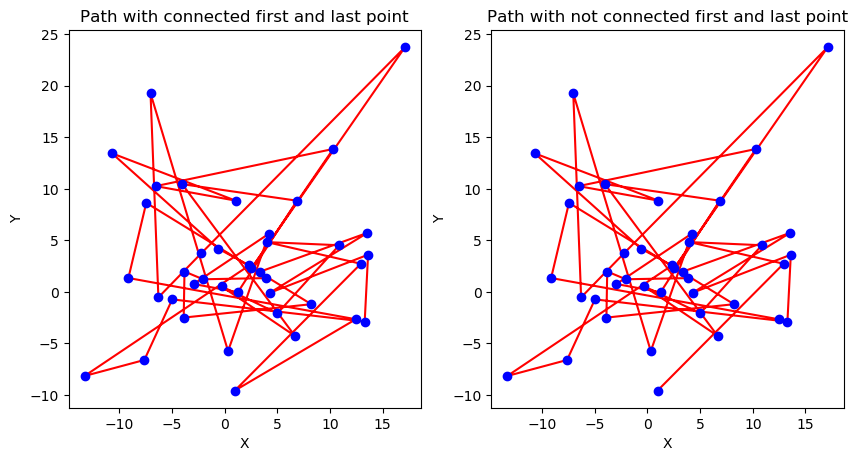

Path was shortened. No of iteration = 56	No of shortening path = 38	 Length of path = 463.70


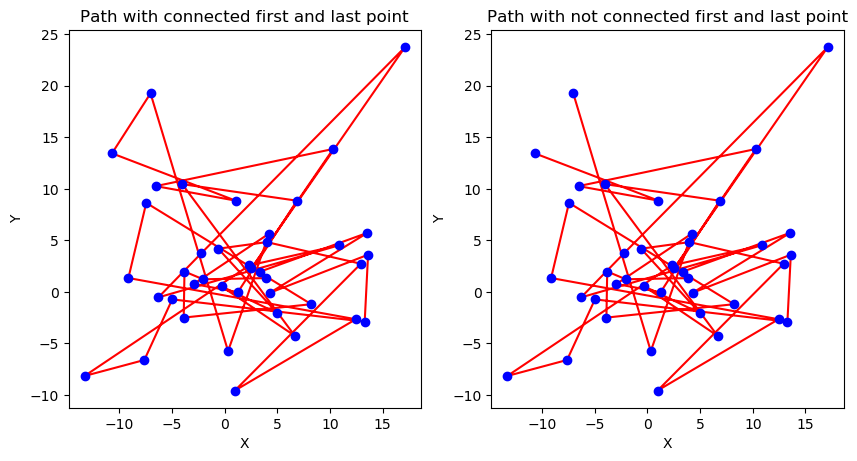

Path was shortened. No of iteration = 123	No of shortening path = 78	 Length of path = 463.46


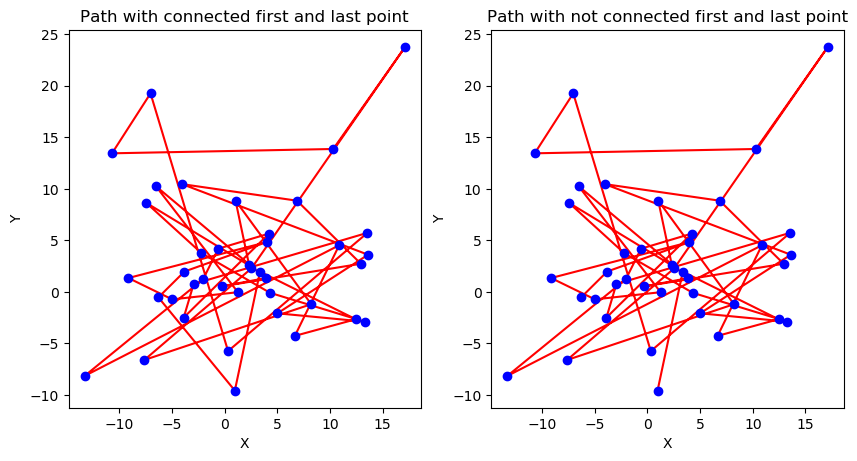

Path was shortened. No of iteration = 126	No of shortening path = 80	 Length of path = 450.06


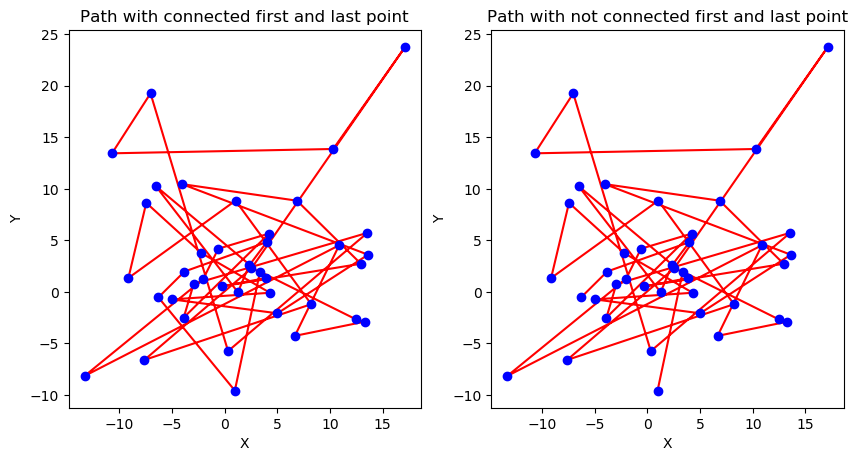

Path was shortened. No of iteration = 452	No of shortening path = 270	 Length of path = 449.70


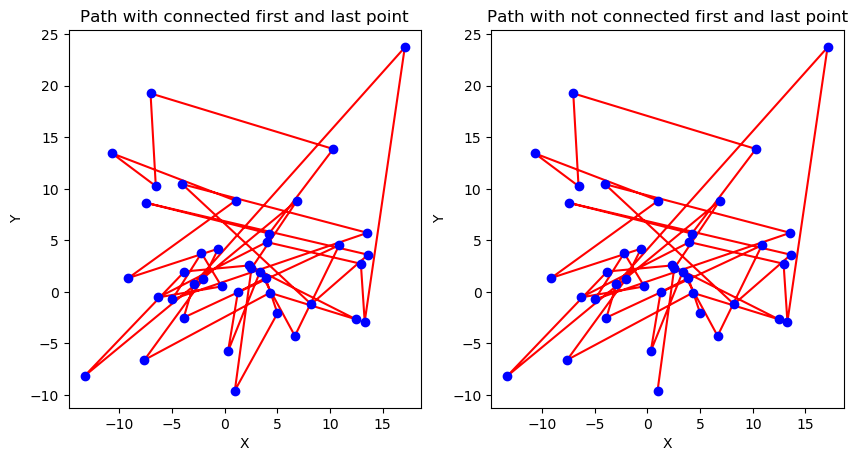

Path was shortened. No of iteration = 550	No of shortening path = 326	 Length of path = 448.24


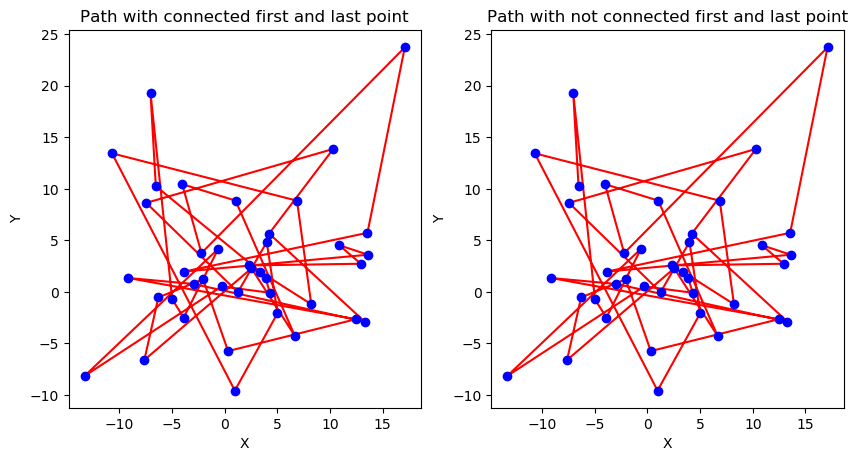

Path was shortened. No of iteration = 634	No of shortening path = 369	 Length of path = 445.47


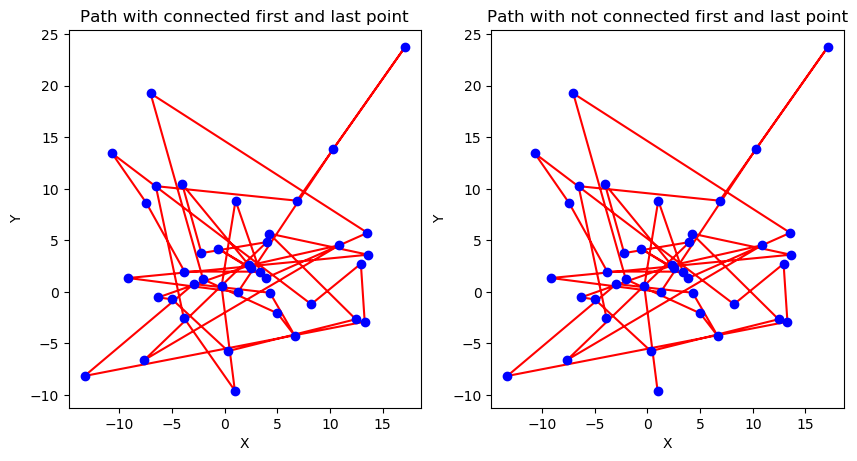

Path was shortened. No of iteration = 827	No of shortening path = 460	 Length of path = 445.33


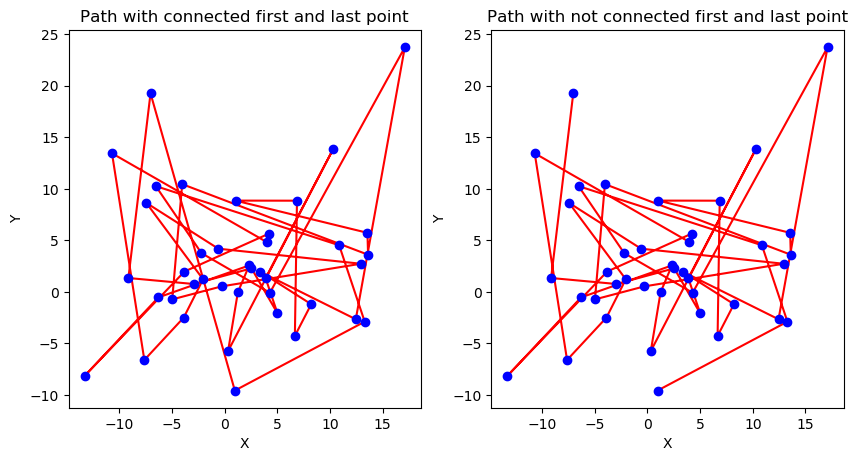

Path was shortened. No of iteration = 976	No of shortening path = 534	 Length of path = 444.97


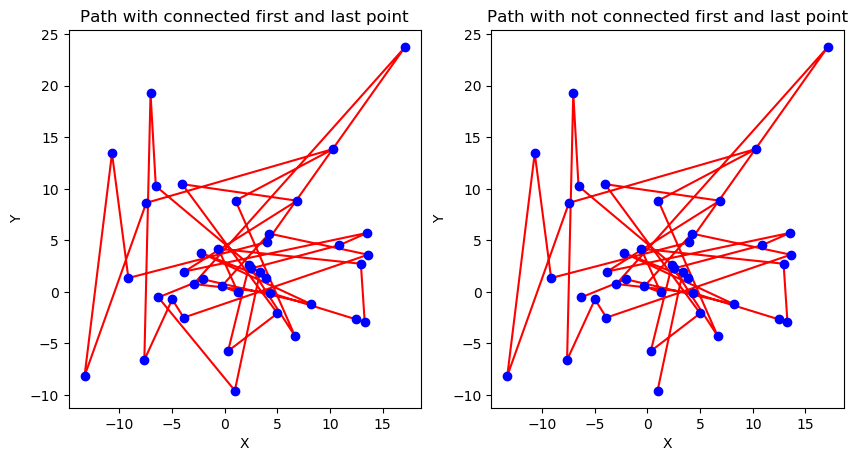

Path was shortened. No of iteration = 980	No of shortening path = 535	 Length of path = 441.13


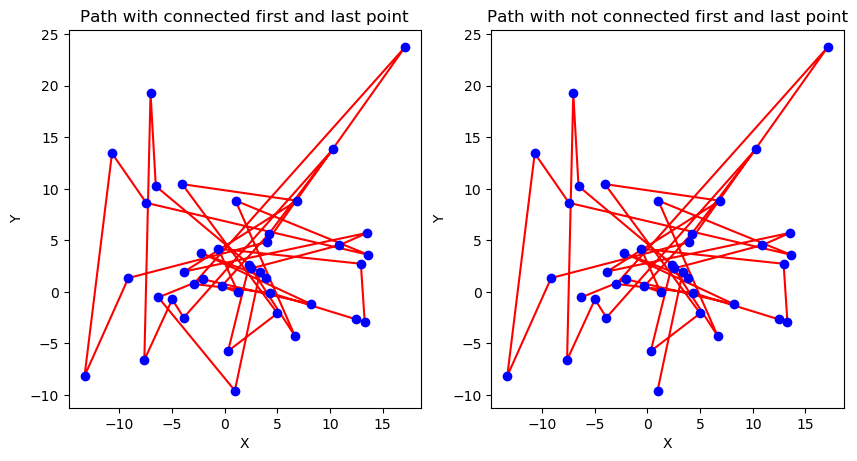

Path was shortened. No of iteration = 1009	No of shortening path = 542	 Length of path = 440.31


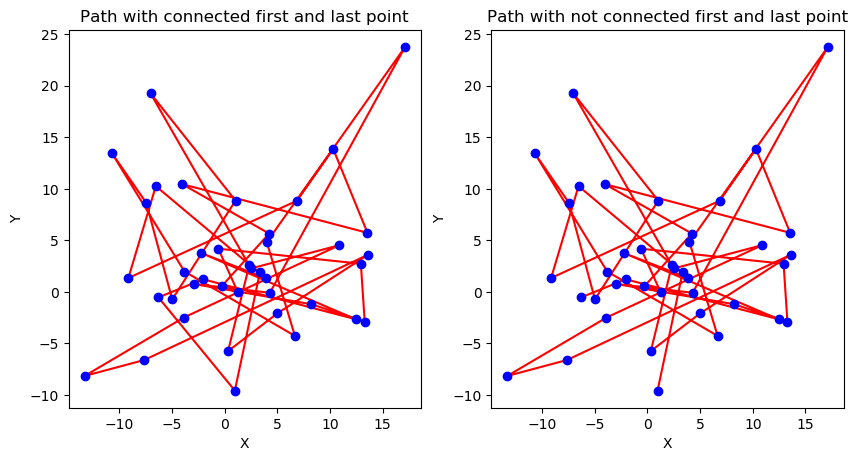

Path was shortened. No of iteration = 1012	No of shortening path = 543	 Length of path = 433.83


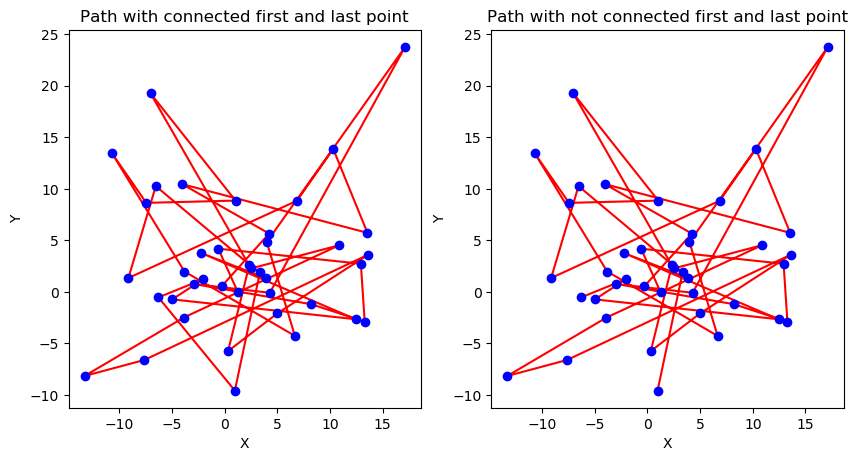

Path was shortened. No of iteration = 1014	No of shortening path = 544	 Length of path = 427.28


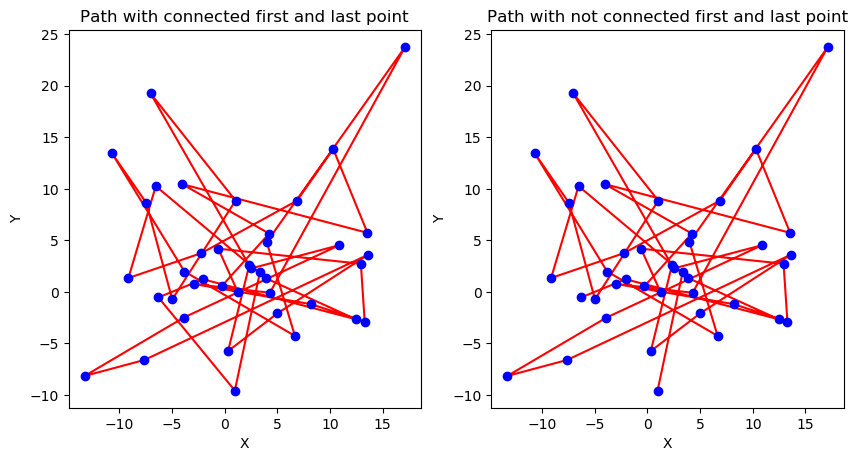

Path was shortened. No of iteration = 1017	No of shortening path = 546	 Length of path = 425.50


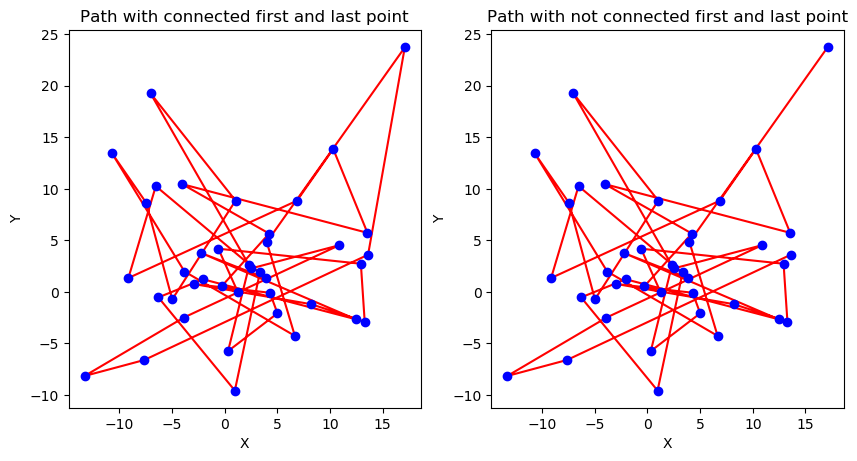

Path was shortened. No of iteration = 1033	No of shortening path = 551	 Length of path = 421.69


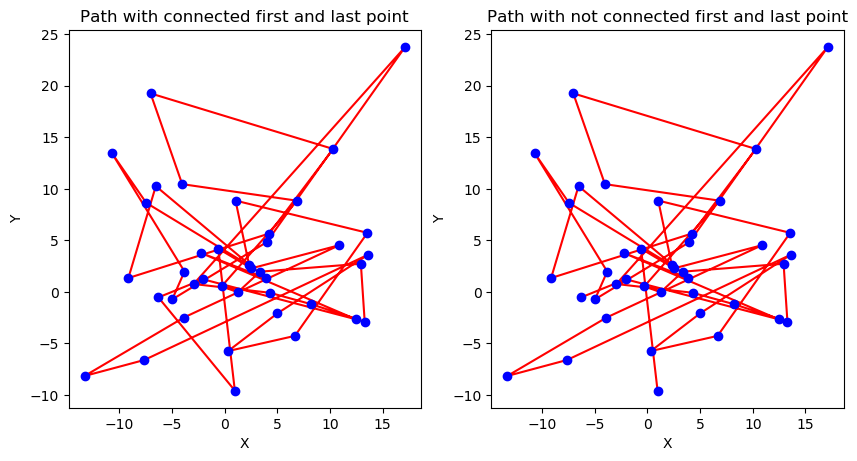

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:118: RuntimeWarning: overflow encountered in exp


Path was shortened. No of iteration = 2124	No of shortening path = 1125	 Length of path = 421.66


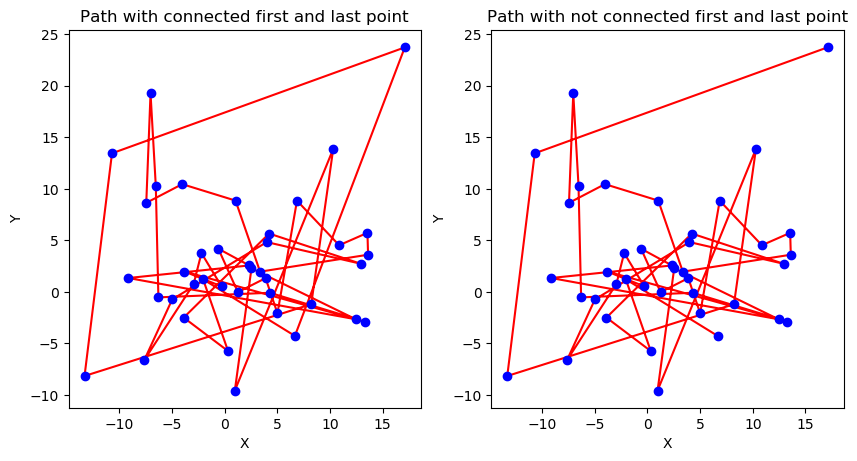

Path was shortened. No of iteration = 2160	No of shortening path = 1144	 Length of path = 413.29


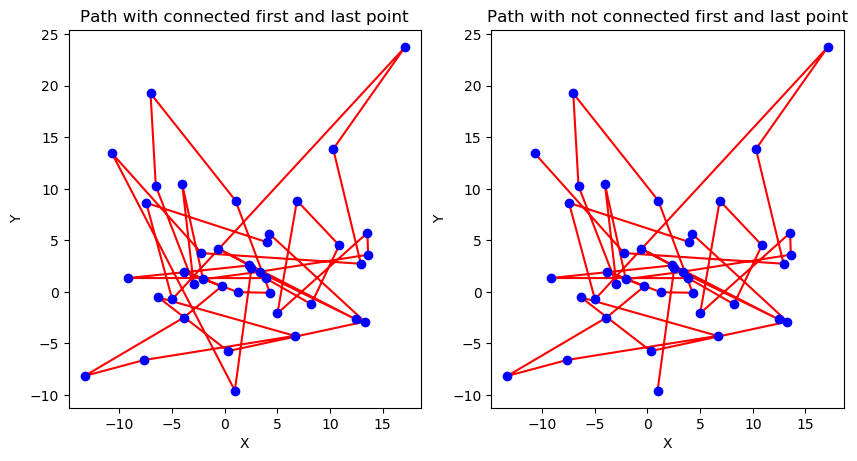

Path was shortened. No of iteration = 19187	No of shortening path = 9925	 Length of path = 397.15


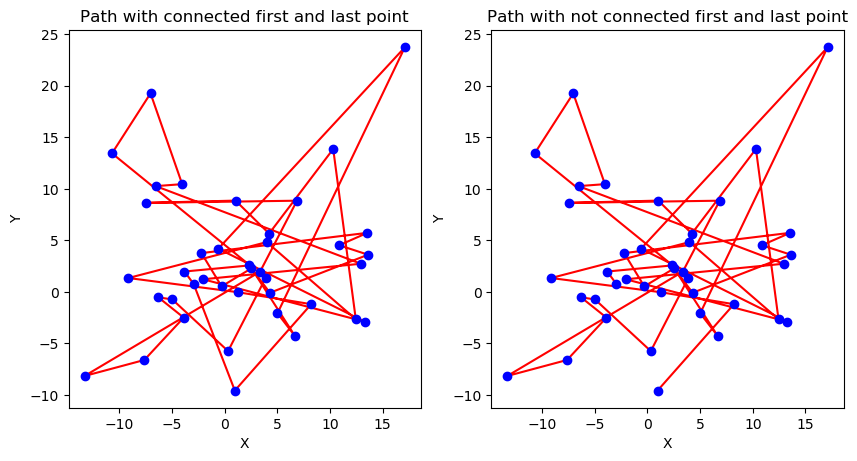

Path was shortened. No of iteration = 71576	No of shortening path = 36677	 Length of path = 395.68


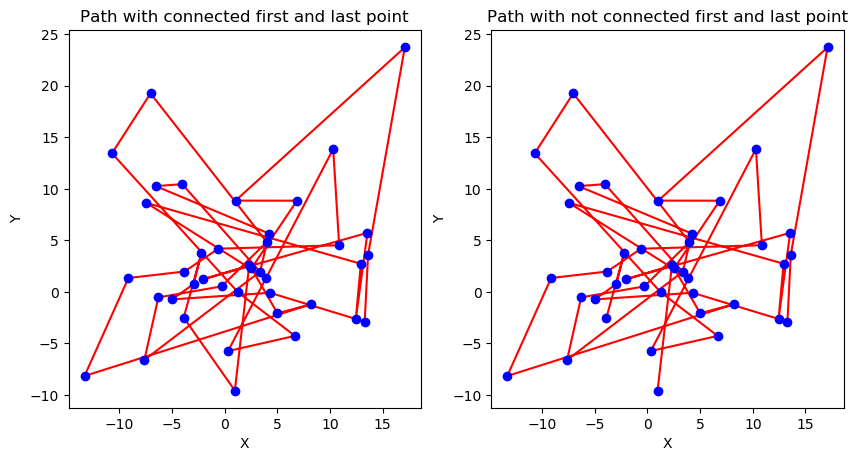

Path was shortened. No of iteration = 71577	No of shortening path = 36678	 Length of path = 390.39


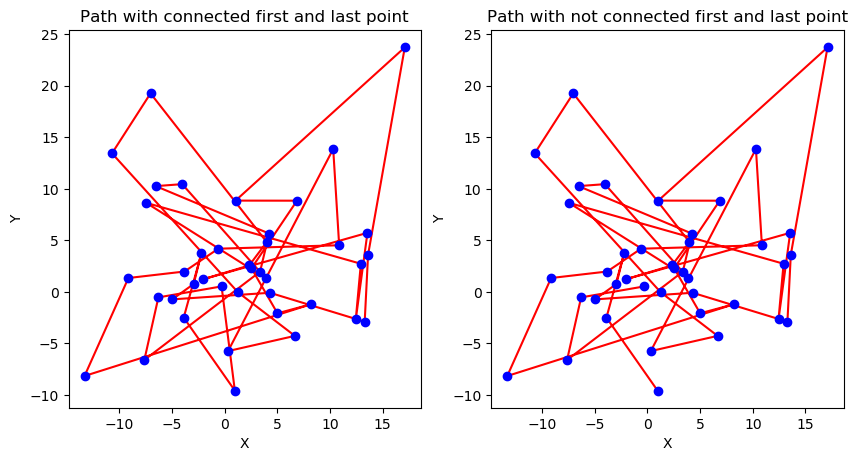

In [39]:
simulated_annealing(10e4, group_gauss(10))

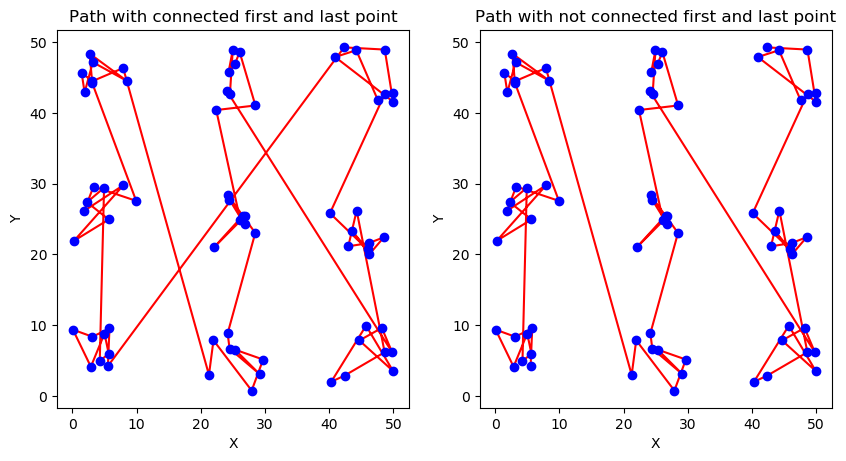

In [40]:
def group_uniform_points(n):
    points = np.array([])
    for i in range(3):
        for j in range(3):
            points = np.append(points, generate_uniform_points(n, 20*i, 20*i + 10, 20*j, 20*j + 10))
    return points

plot(group_uniform_points(8)) 

Path was shortened. No of iteration = 10	No of shortening path = 1	 Length of path = 863.34


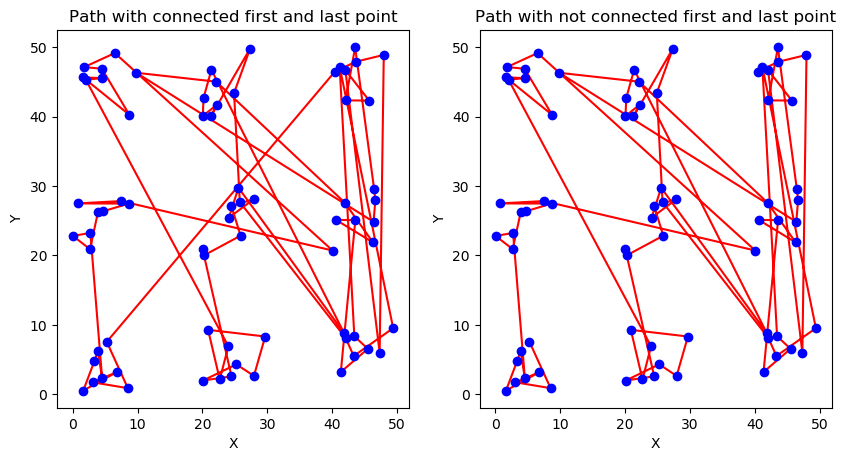

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: overflow encountered in exp


In [105]:
simulated_annealing(10e4, group_uniform_points(8))

<h6>Wnioski</h6>
Funkcja skraca długośc trasy. Jest ciężko stwierdzić jak bardzo jest optymalna trasa, ponieważ jest to problem NP-zupełny, którego rozwiązanie ma złożoność $O(n!)$, a rozwiązanie szybsze oparte na programownaiu dynamicznym ma złożoność $O({n}^{2}{2}^{n})$ i nie można wyznaczyc rozwiązania optymalnego dla większego n.

b) Zbadaj wpływ sposobu generacji sąsiedniego stanu ($consecutive$ $swap$ - zamiana
kolejności losowej pary połączonych wierzchołków w ścieżce vs. $arbitrary$ $swap$ -
zamiana dwóch losowych wierzchołków w ścieżce) oraz początkowej wartości temperatury na zbieżność procesu optymalizacji.

In [108]:
def swap_simulated_annealing_diff(func,points ,beta, n_accept, best_energy):
    n = len(points)
    energy = path_length(points)
    new_path = False

    if n_accept >= 100 * np.log(n):
        beta *=1.005

    new_points = func(points)

    new_energy = path_length(new_points)
    if random.uniform(0.0, 1.0) < np.exp(-beta * (new_energy - energy)):
        n_accept += 1
        energy = new_energy
        points = new_points[:]
        if energy < best_energy:
            best_energy = energy
            best_path = points[:]
            new_path = True

    return points, beta, n_accept, best_energy, new_path

Path was shortened. No of iteration = 0	No of shortening path = 1	 Length of path = 103.65


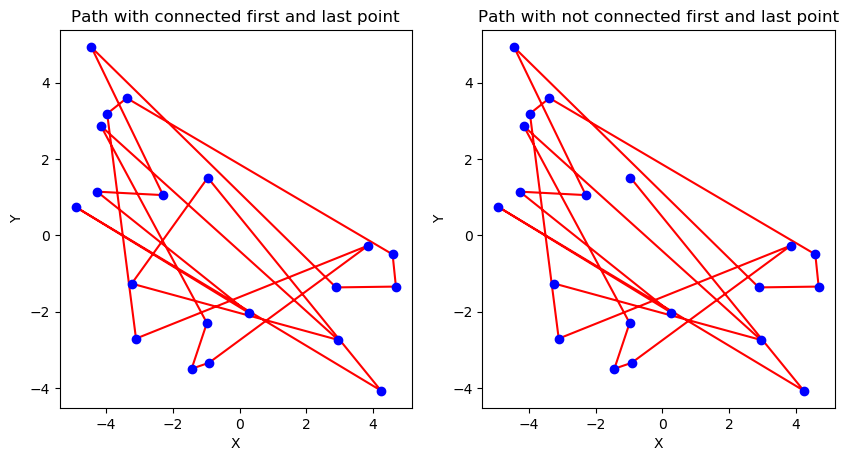

Path was shortened. No of iteration = 1	No of shortening path = 2	 Length of path = 92.86


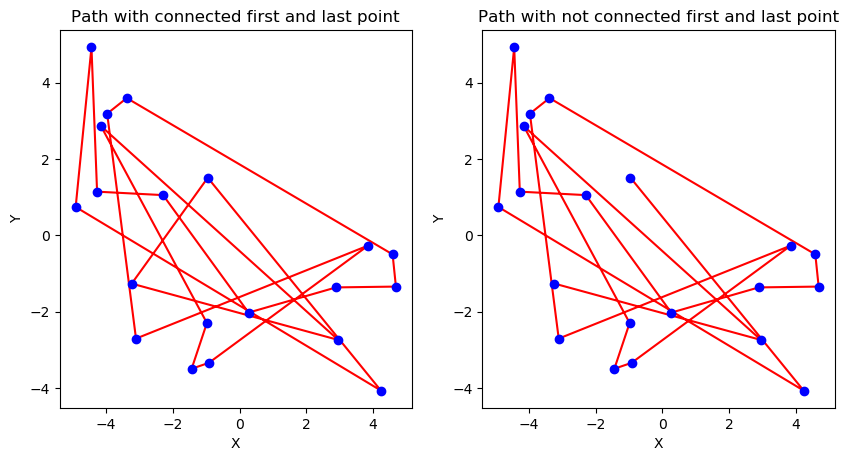

Path was shortened. No of iteration = 10	No of shortening path = 7	 Length of path = 85.11


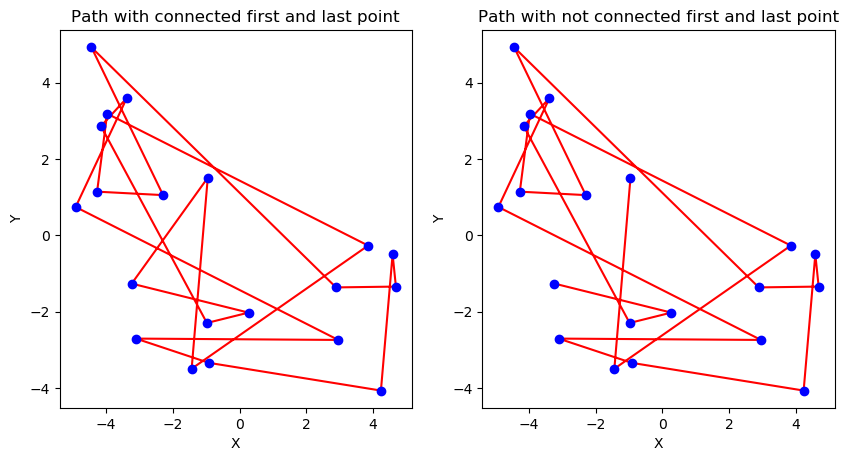

Path was shortened. No of iteration = 161	No of shortening path = 105	 Length of path = 83.61


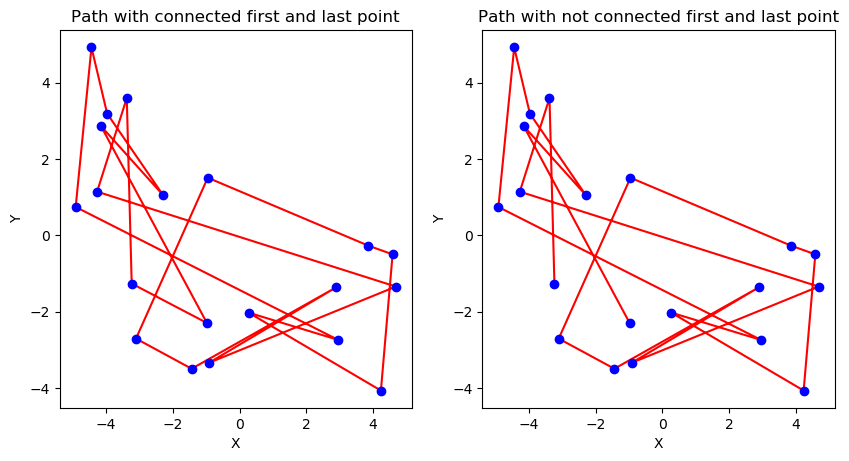

Path was shortened. No of iteration = 387	No of shortening path = 242	 Length of path = 75.20


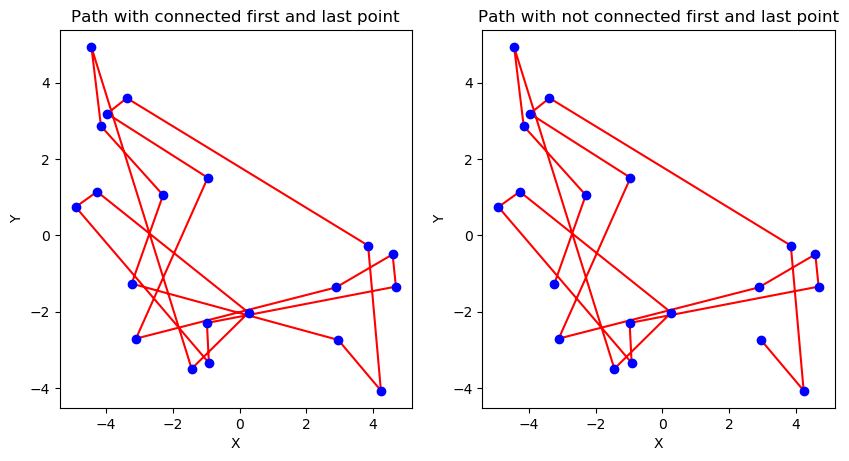

Path was shortened. No of iteration = 937	No of shortening path = 557	 Length of path = 74.35


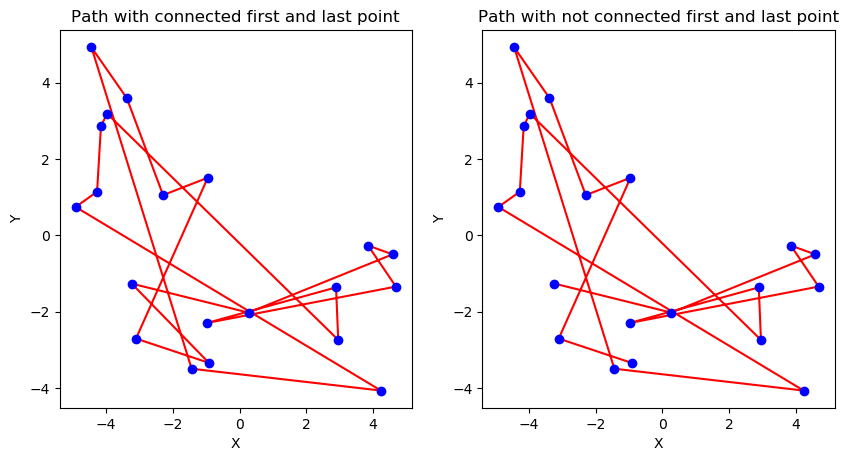

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in exp
  if sys.path[0] == '':


Path was shortened. No of iteration = 2569	No of shortening path = 1403	 Length of path = 73.43


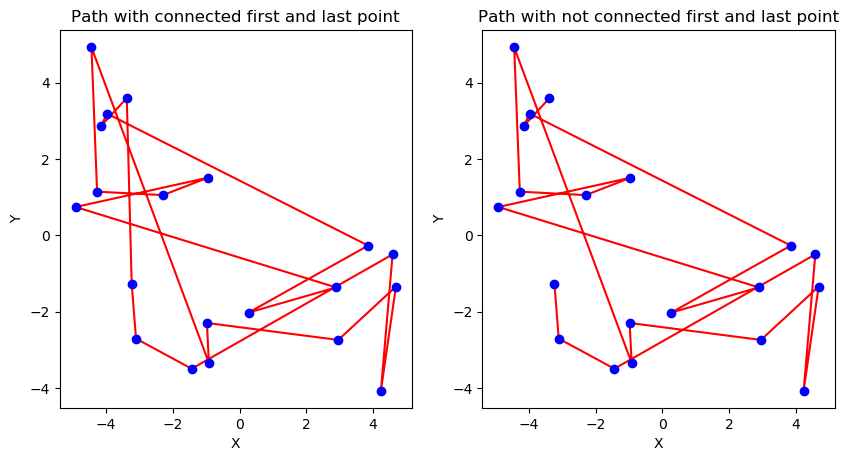

Path was shortened. No of iteration = 5350	No of shortening path = 2871	 Length of path = 73.39


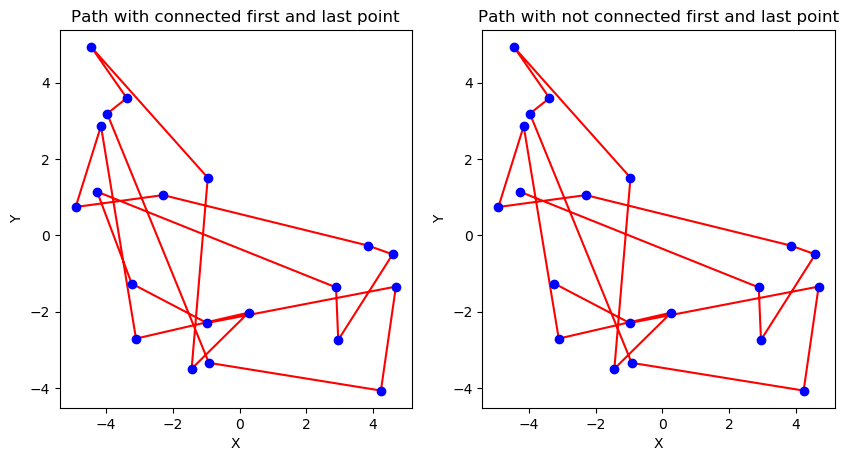

Path was shortened. No of iteration = 5351	No of shortening path = 2872	 Length of path = 70.21


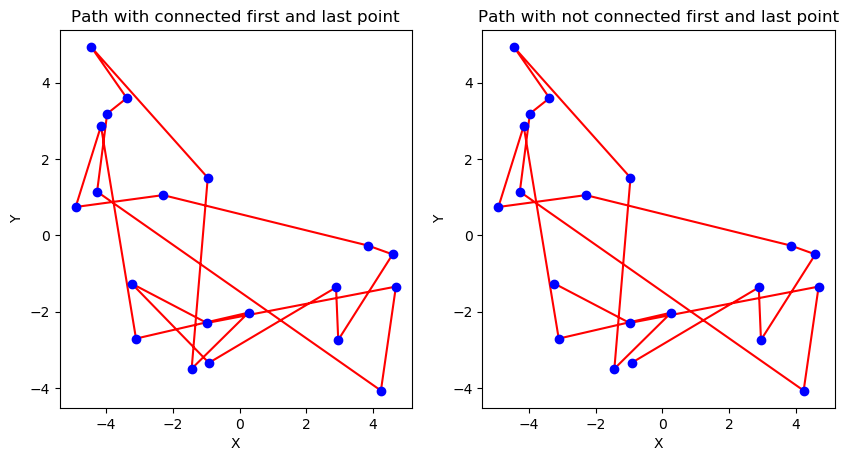

Path was shortened. No of iteration = 5416	No of shortening path = 2903	 Length of path = 66.65


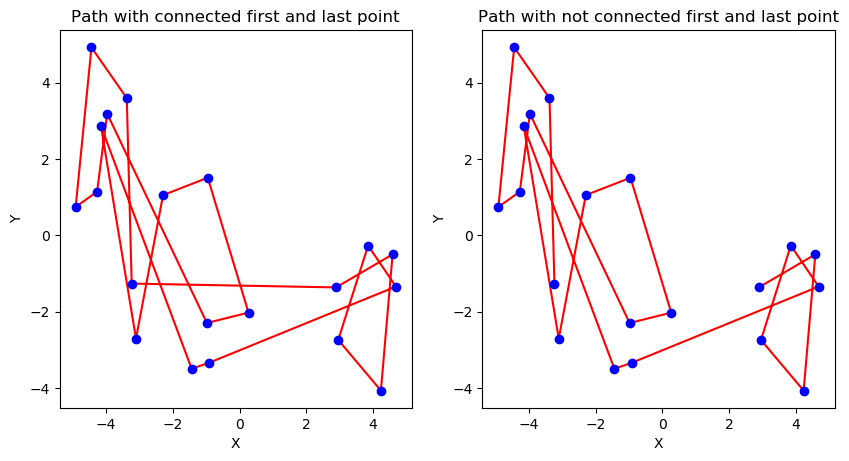

Path was shortened. No of iteration = 6229	No of shortening path = 3324	 Length of path = 66.43


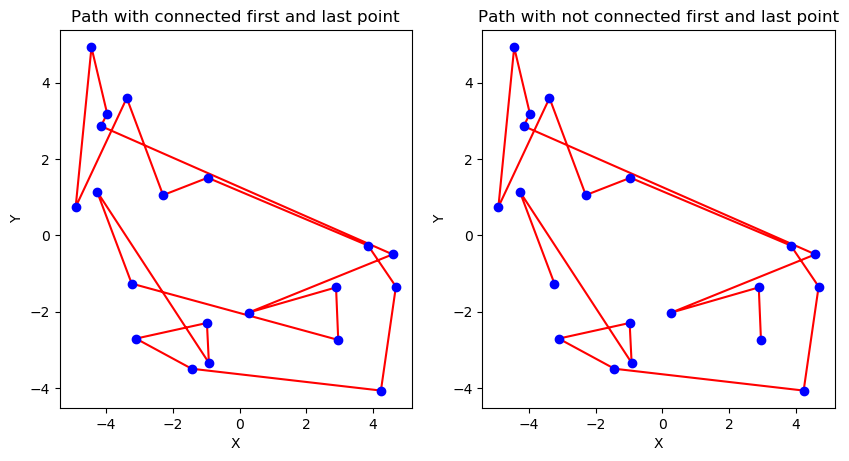

In [109]:
def simulated_annealing_diff(func, no_of_iter, points):
    energy_min = float('inf')
    beta = 1.0
    n_accept = 0
    iteration = 0
    best_energies = []
    while iteration < no_of_iter:
        new_points, beta, n_accept, energy_min, new_path = \
            swap_simulated_annealing_diff(func, points[:], beta, n_accept, energy_min)
        if new_path:
            print("Path was shortened. No of iteration = %d\tNo of shortening path = %d\t Length of path = %4.2f"
                  % (iteration, n_accept, energy_min))
            plot(new_points)
            best_energies.append((iteration, energy_min))
        iteration += 1
    return best_energies


points = generate_uniform_points(20, -5, 5, -5, 5)
arbitrary_path_lengths = simulated_annealing_diff(arbitrary_swap, 10e3, points)


Path was shortened. No of iteration = 1	No of shortening path = 1	 Length of path = 98.65


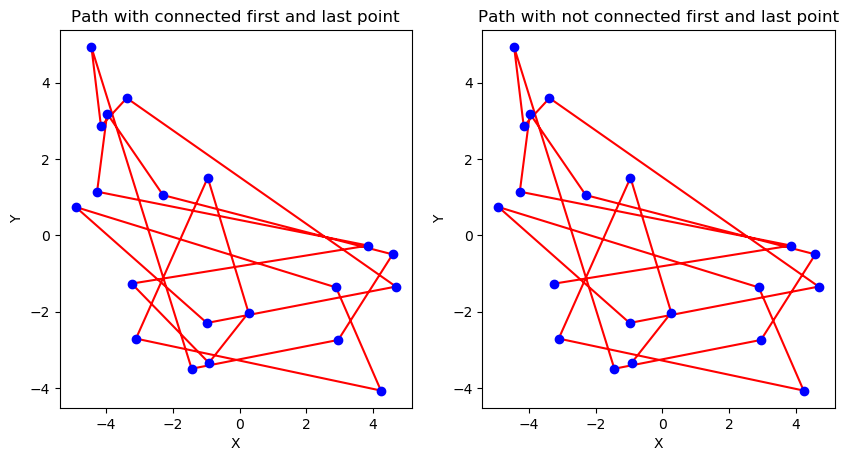

Path was shortened. No of iteration = 3	No of shortening path = 3	 Length of path = 95.62


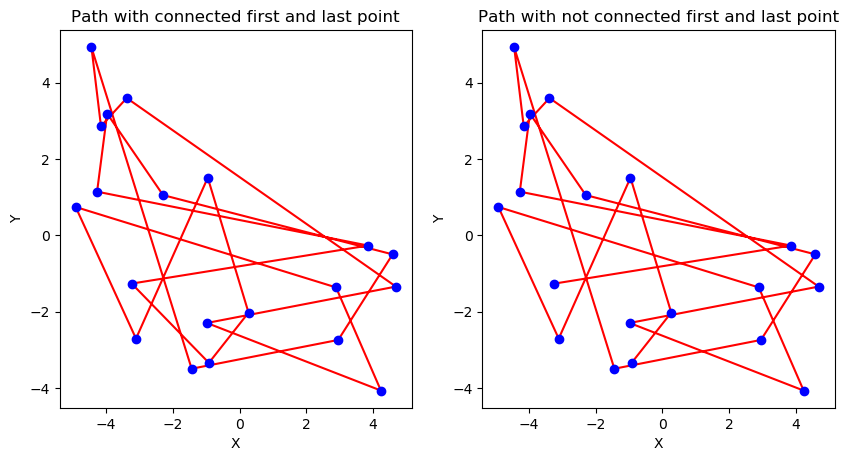

Path was shortened. No of iteration = 25	No of shortening path = 17	 Length of path = 91.99


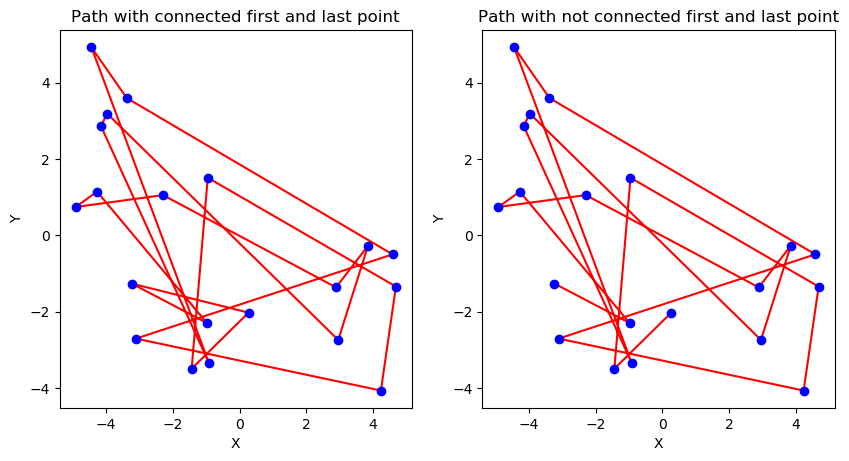

Path was shortened. No of iteration = 26	No of shortening path = 18	 Length of path = 88.40


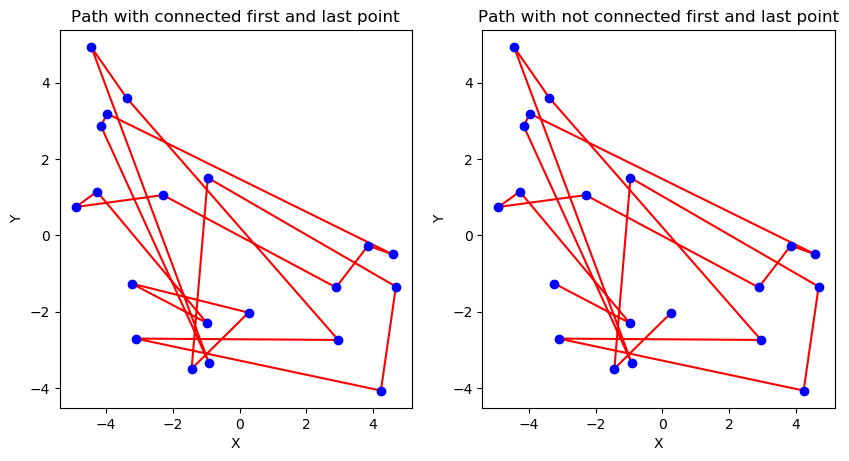

Path was shortened. No of iteration = 163	No of shortening path = 99	 Length of path = 82.97


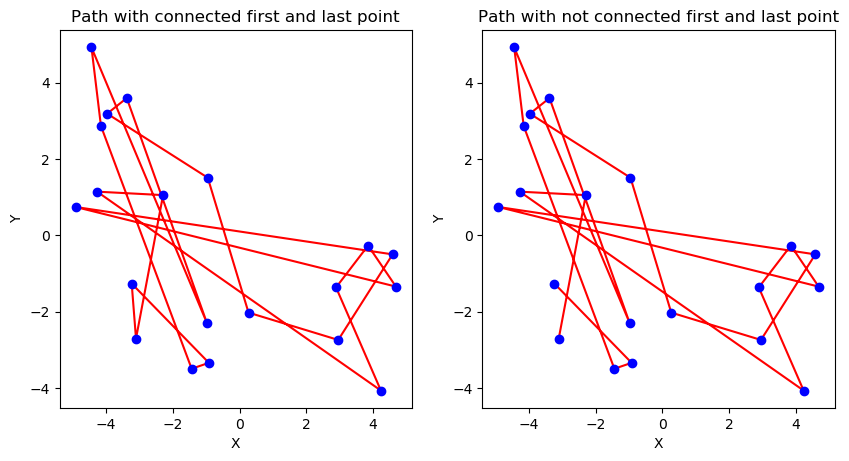

Path was shortened. No of iteration = 165	No of shortening path = 100	 Length of path = 70.33


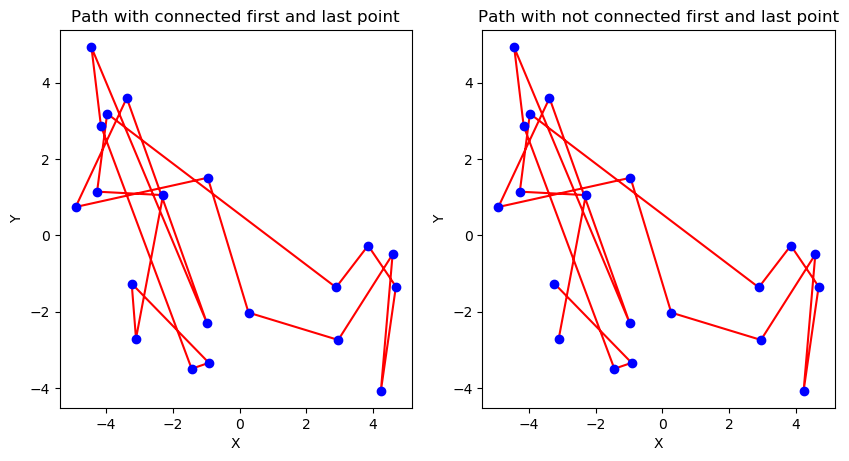

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in exp
  if sys.path[0] == '':


Path was shortened. No of iteration = 7641	No of shortening path = 4088	 Length of path = 69.71


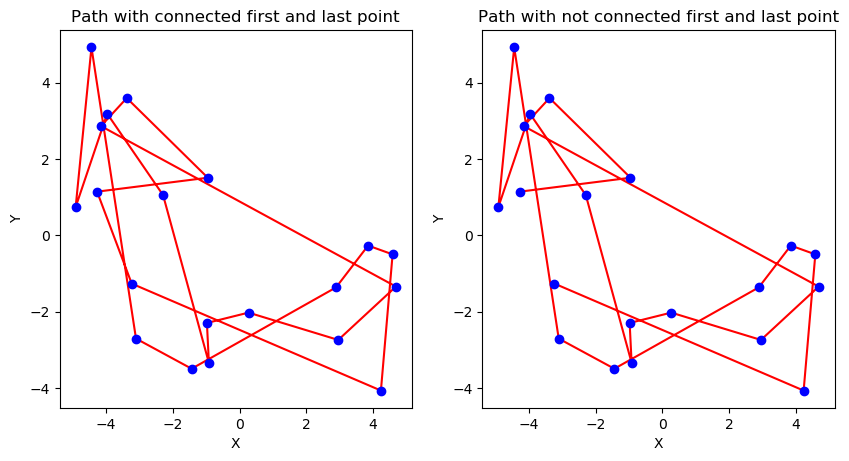

Path was shortened. No of iteration = 8872	No of shortening path = 4728	 Length of path = 67.72


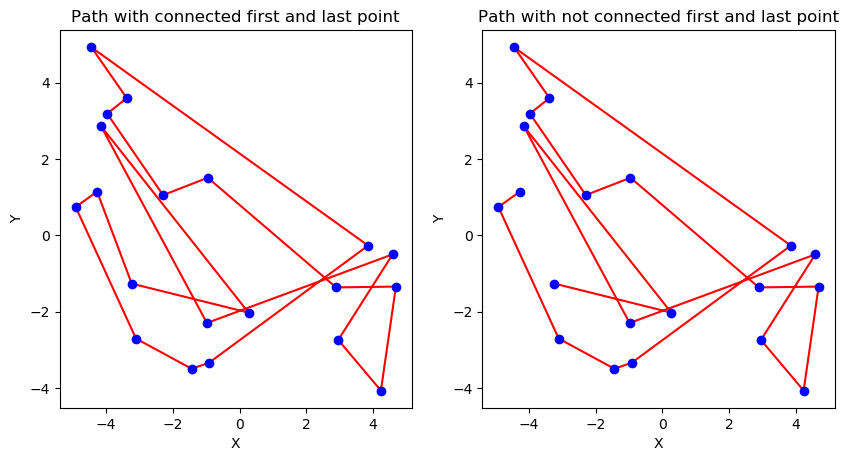

Path was shortened. No of iteration = 8975	No of shortening path = 4783	 Length of path = 66.36


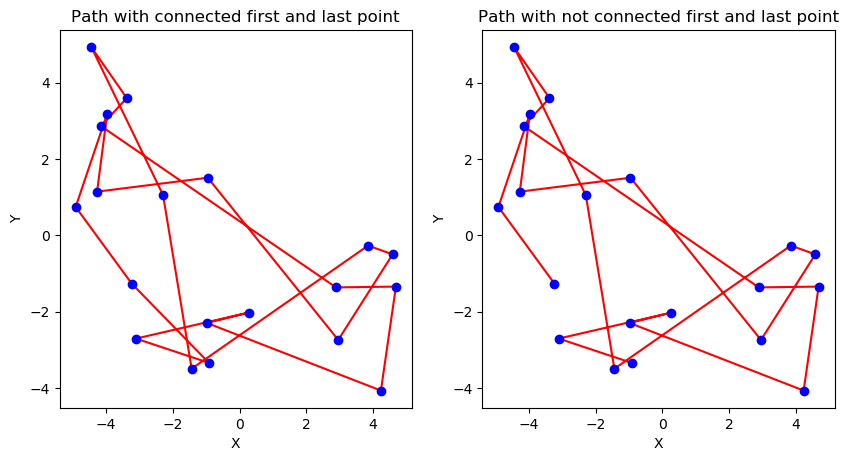

Path was shortened. No of iteration = 8976	No of shortening path = 4784	 Length of path = 65.54


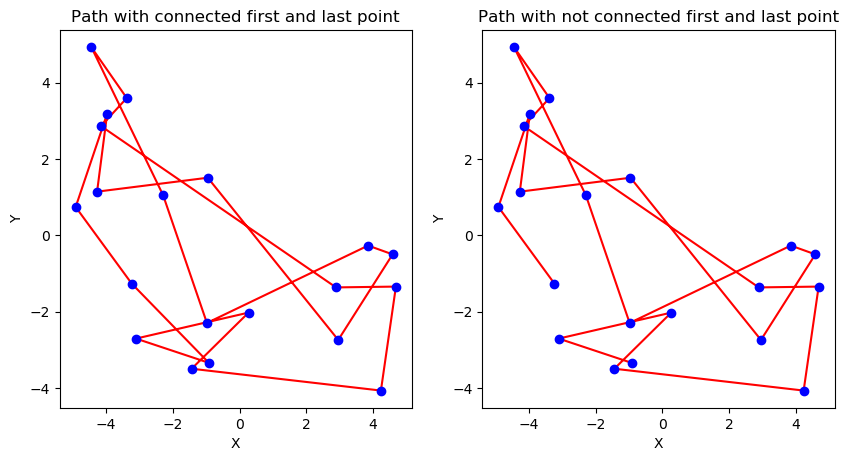

In [110]:
def consecutive_swap(points):
    n = len(points)

    i = random.randint(1, n - 1)
    points[i], points[i + 1] = points[i + 1], points[i]

    return points


consecutive_path_lengths = simulated_annealing_diff(arbitrary_swap, 10e3, points)

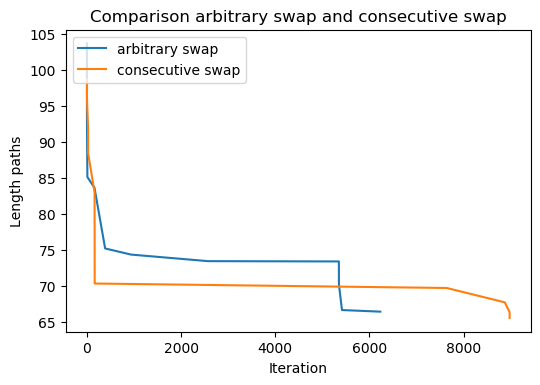

In [112]:
def diff_arbitrary_consecutive():
    # tuple to two array
    arbitrary_x, arbitrary_y = zip(*arbitrary_path_lengths)
    plt.plot(arbitrary_x, arbitrary_y, label = "arbitrary swap")

    consecutive_x, consecutive_y = zip(*consecutive_path_lengths)
    plt.plot(consecutive_x, consecutive_y, label = "consecutive swap")

    plt.legend(loc="upper left")
    plt.ylabel('Length paths')
    plt.xlabel('Iteration')
    plt.title("Comparison arbitrary swap and consecutive swap");
    plt.show()


diff_arbitrary_consecutive()

<h6>Wnioski</h6>
Przy tak zaimplementowanej funkcji i takich rozlokowaniu punktów z rozkładem jednostajnym rozwiązywanie za pomocą arbitrary swap i consecutive swap daje podobne rezultaty.

In [113]:
def swap_simulated_annealing_temp(points ,beta, n_accept, best_energy):
    n = len(points)
    energy = path_length(points)
    new_path = False

    if n_accept >= 100 * np.log(n):
        beta *=1.005

    p = np.random.uniform(0.0, 1.0)
    if p < 0.2:
        new_points = cut_swap_cut_reverse_first(points)
    elif p < 0.6:
        new_points = move_rand_point_to_rand_pos(points)
    else:
        new_points = arbitrary_swap(points)

    new_energy = path_length(new_points)
    if random.uniform(0.0, 1.0) < np.exp(-beta * (new_energy - energy)):
        n_accept += 1
        energy = new_energy
        points = new_points[:]
        if energy < best_energy:
            best_energy = energy
            best_path = points[:]
            new_path = True

    return points, beta, n_accept, best_energy, new_path, energy


def simulated_annealing_temp(no_of_iter, points, temperature):
    energy_min = float('inf')
    beta = 1/temperature
    n_accept = 0
    iter = 0
    best_energies = []
    while iter < no_of_iter:
        iter += 1
        new_points, beta, n_accept, energy_min, new_path, old_energy = \
            swap_simulated_annealing_temp(points[:], beta, n_accept, energy_min)
        if new_path:

            best_energies.append((iter,  energy_min))
    
    return best_energies


/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: overflow encountered in exp


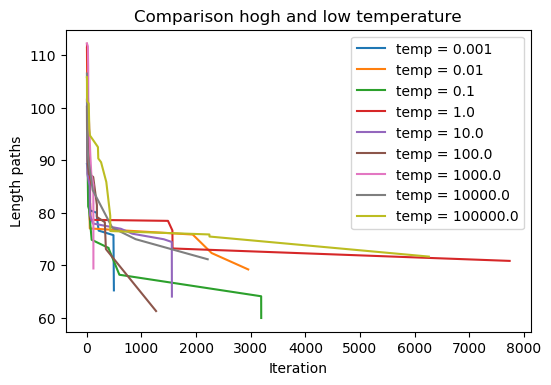

In [114]:
def diff_temperature():
    for temp in [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3, 1e4, 1e5]:
        temp_paths = simulated_annealing_temp(10e3, generate_uniform_points(20, -5, 5, -5, 5), temp)
        x, y = zip(*temp_paths)
        plt.plot(x, y, label="temp = {}".format(temp))



    plt.legend(loc="upper right")
    plt.ylabel('Length paths')
    plt.xlabel('Iteration')
    plt.title("Comparison hogh and low temperature");
    plt.show()


diff_temperature()

<h6>Wnioski</h6>
Rozwiązanie daje najlepsze rezultaty(njakrótsżą drogę) dla n z zakresu (0.1, 100)

c) Przedstaw wizualizację działania procedury minimalizującej funkcję celu (funkcja
przekazana do metody dual annealing może modyfikować zewnątrzny stan)

Path was shortened. No of iteration = 1	No of shortening path = 1	 Length of path = 100.97


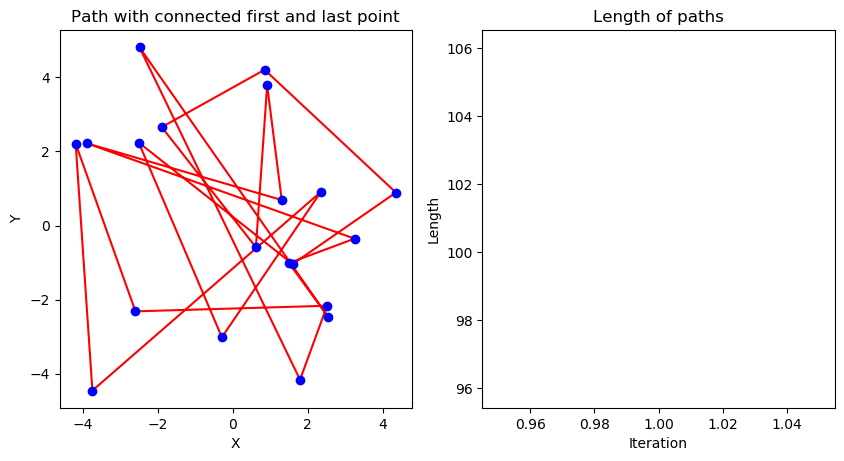

Path was shortened. No of iteration = 3	No of shortening path = 2	 Length of path = 94.61


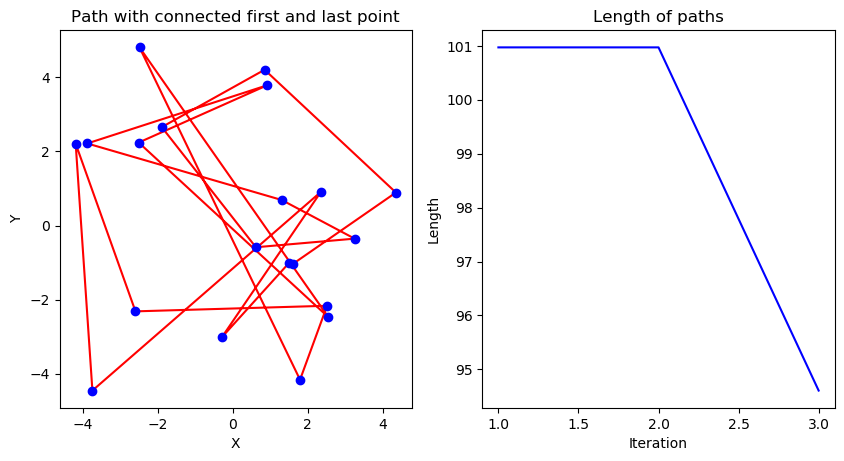

Path was shortened. No of iteration = 22	No of shortening path = 14	 Length of path = 93.07


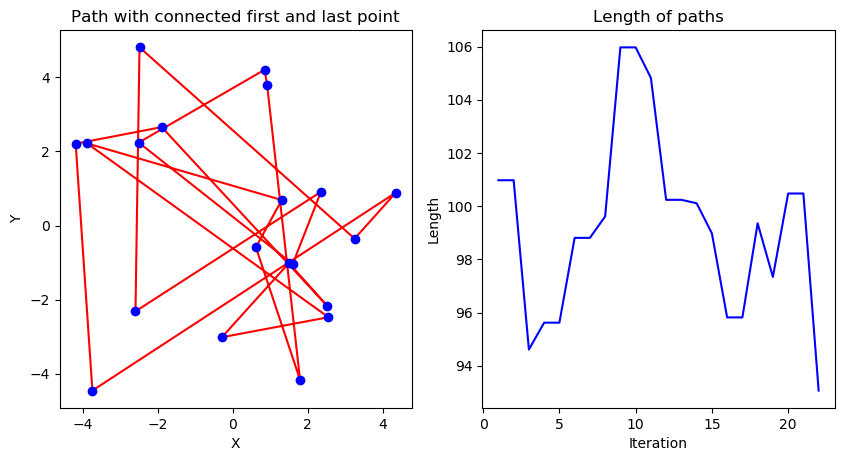

Path was shortened. No of iteration = 25	No of shortening path = 16	 Length of path = 92.51


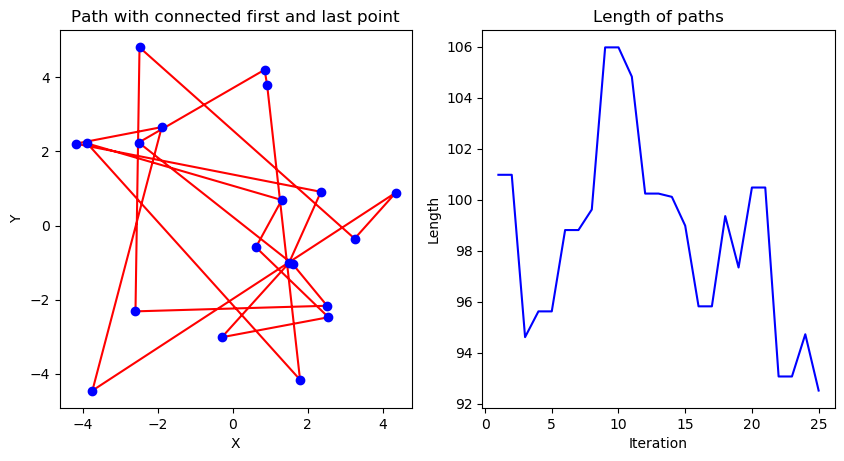

Path was shortened. No of iteration = 26	No of shortening path = 17	 Length of path = 92.34


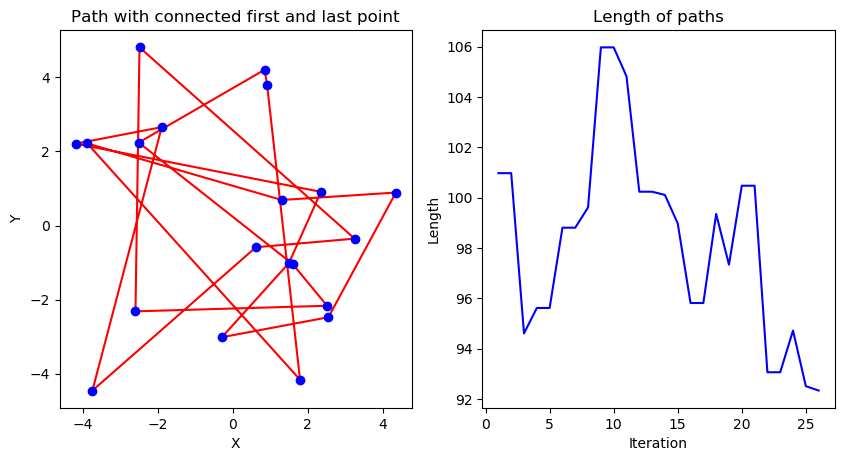

Path was shortened. No of iteration = 27	No of shortening path = 18	 Length of path = 88.91


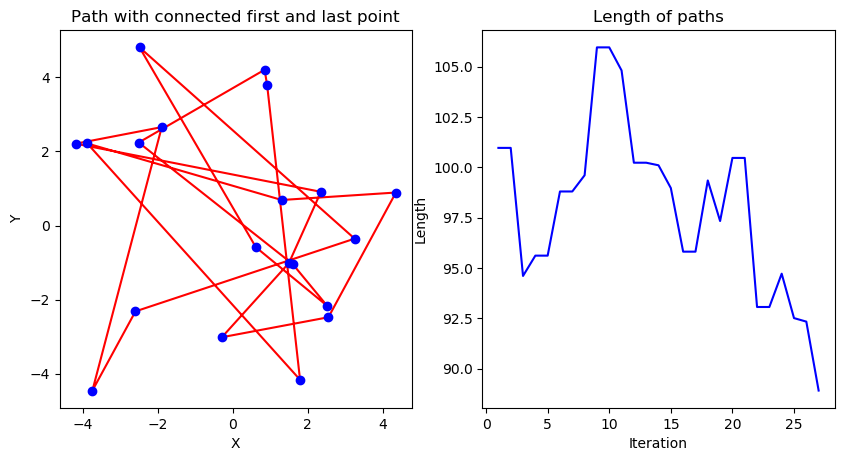

Path was shortened. No of iteration = 28	No of shortening path = 19	 Length of path = 81.44


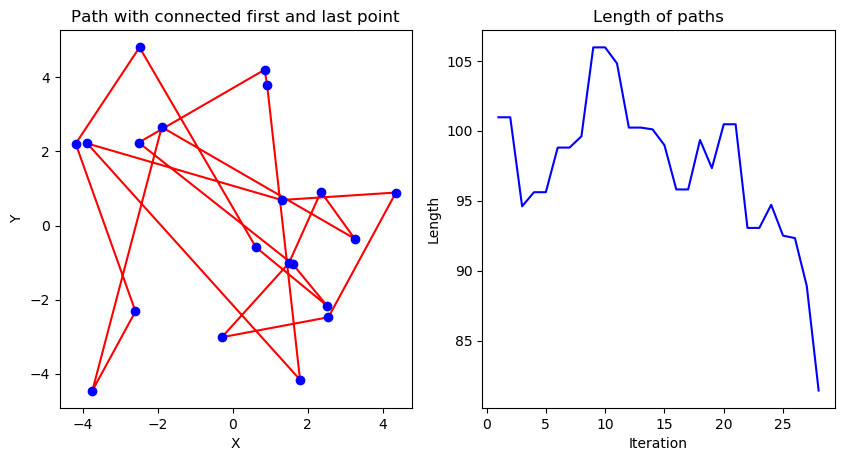

Path was shortened. No of iteration = 88	No of shortening path = 54	 Length of path = 79.82


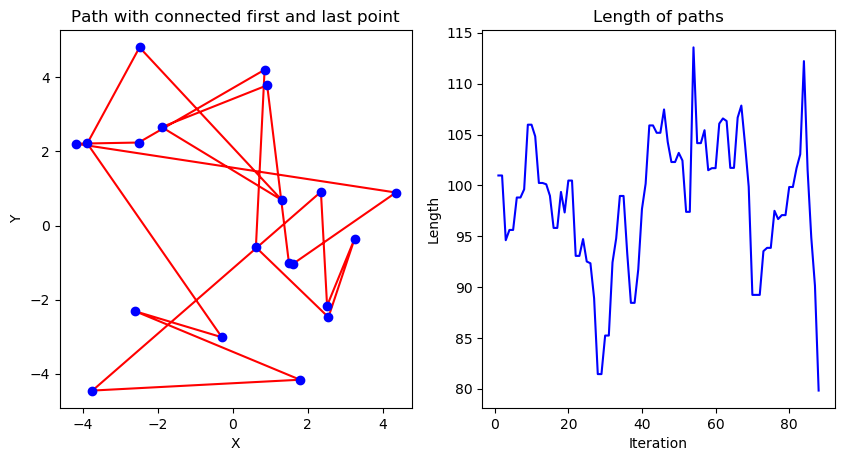

Path was shortened. No of iteration = 276	No of shortening path = 175	 Length of path = 76.67


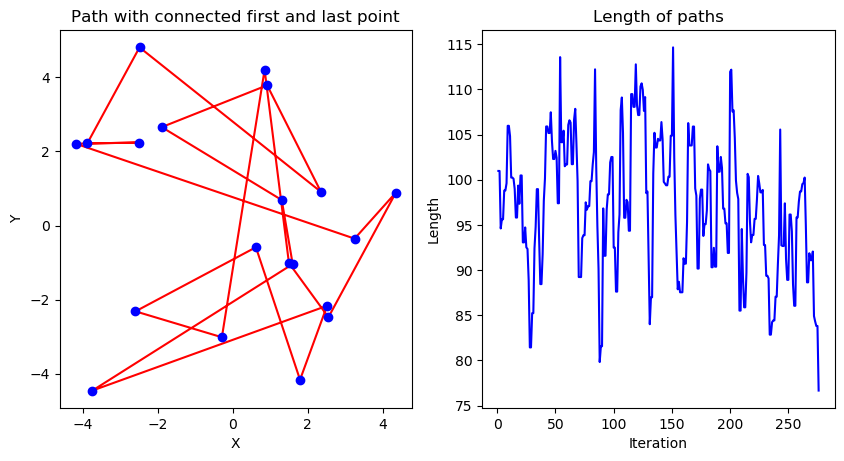

Path was shortened. No of iteration = 277	No of shortening path = 176	 Length of path = 72.17


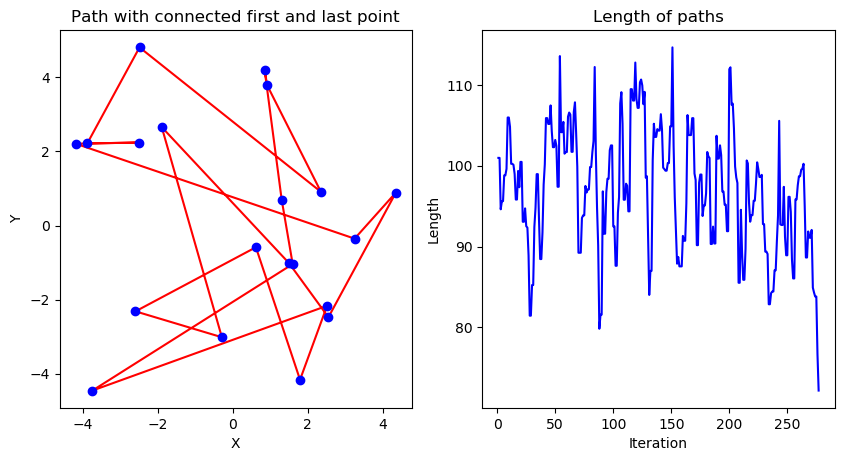

Path was shortened. No of iteration = 649	No of shortening path = 406	 Length of path = 71.70


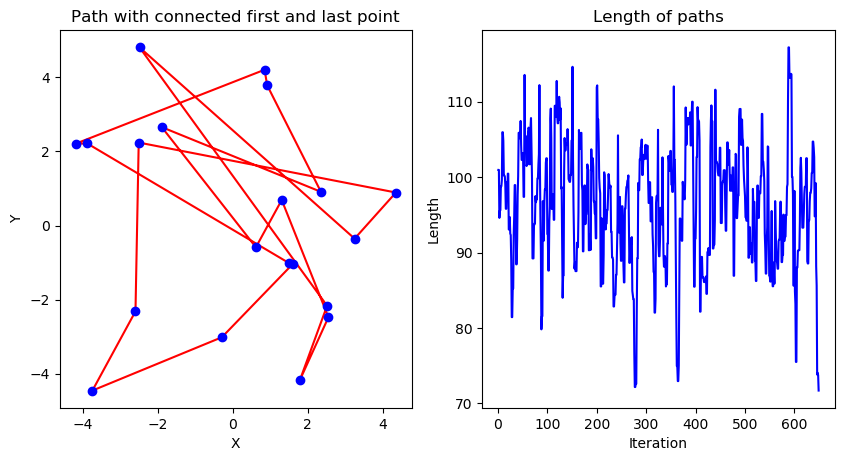

Path was shortened. No of iteration = 650	No of shortening path = 407	 Length of path = 64.75


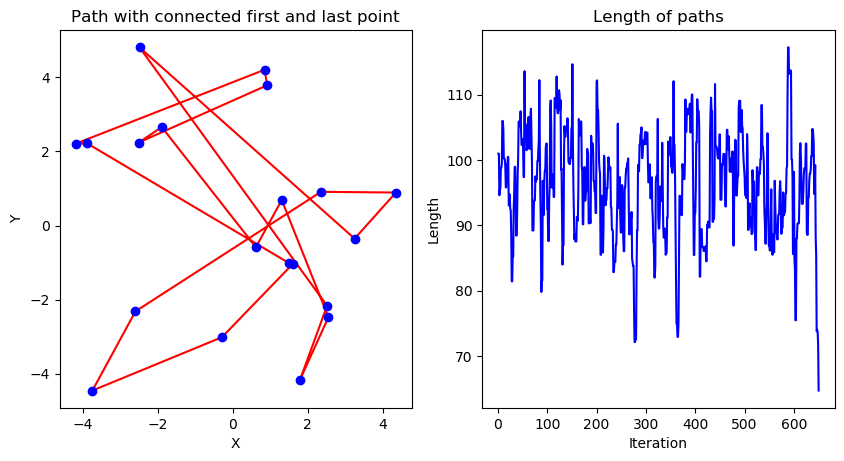

/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: overflow encountered in exp


In [91]:
def plot_length(points, iter, energies_lenghts):
    n = len(points)

    plt.figure(figsize=[10, 5])
    plt.subplot(1, 2, 1)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Path with connected first and last point")
    plt.plot( np.append([points[i].x for i in range(n)], points[0].x), np.append([points[i].y for i in range(n)], points[0].y),  "r")
    plt.plot( [points[i].x for i in range(n)],[points[i].y for i in range(n)] ,  "bo")

    plt.subplot(1, 2, 2)
    plt.plot(np.arange(1, iter + 1) ,energies_lenghts,  "b")
    plt.xlabel("Iteration")
    plt.ylabel("Length")
    plt.title("Length of paths")
    plt.show()

def swap_simulated_annealing_length(func,points ,beta, n_accept, best_energy):
    n = len(points)
    energy = path_length(points)
    new_path = False

    if n_accept >= 100 * np.log(n):
        beta *=1.005

    new_points = func(points)

    new_energy = path_length(new_points)
    if random.uniform(0.0, 1.0) < np.exp(-beta * (new_energy - energy)):
        n_accept += 1
        energy = new_energy
        points = new_points[:]
        if energy < best_energy:
            best_energy = energy
            best_path = points[:]
            new_path = True

    return points, beta, n_accept, best_energy, new_path, energy

def simulated_annealing_length(func, no_of_iter, points):
    energy_min = float('inf')
    beta = 1.0
    n_accept = 0
    iter = 0
    energies_lenghts = np.array([])
    while iter < no_of_iter:
        iter += 1
        new_points, beta, n_accept, energy_min, new_path, old_energy = \
            swap_simulated_annealing_length(func, points[:], beta, n_accept, energy_min)
        energies_lenghts = np.append(energies_lenghts, old_energy)
        if new_path:
            print("Path was shortened. No of iteration = %d\tNo of shortening path = %d\t Length of path = %4.2f"
                  % (iter, n_accept, energy_min))
            plot_length(new_points, iter, energies_lenghts)

    return

points = generate_uniform_points(20, -5, 5, -5, 5)
simulated_annealing_length(arbitrary_swap, 10e3, points)


Path was shortened. No of iteration = 1	No of shortening path = 1	 Length of path = 103.38


<Figure size 1000x500 with 0 Axes>

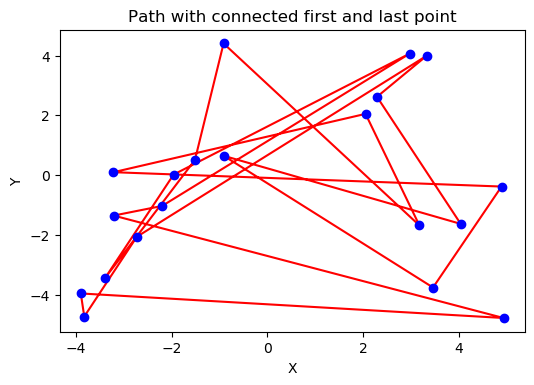

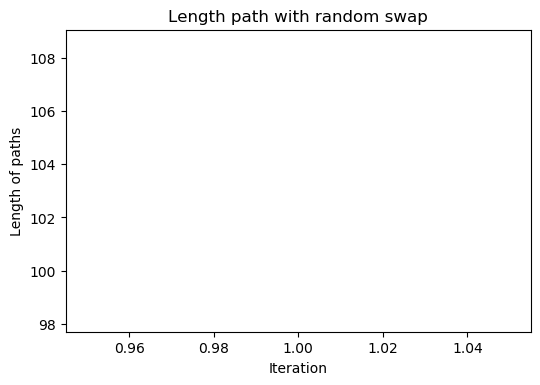

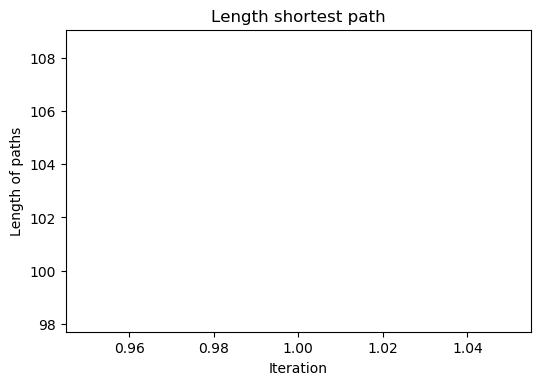

Path was shortened. No of iteration = 53	No of shortening path = 30	 Length of path = 91.97


<Figure size 1000x500 with 0 Axes>

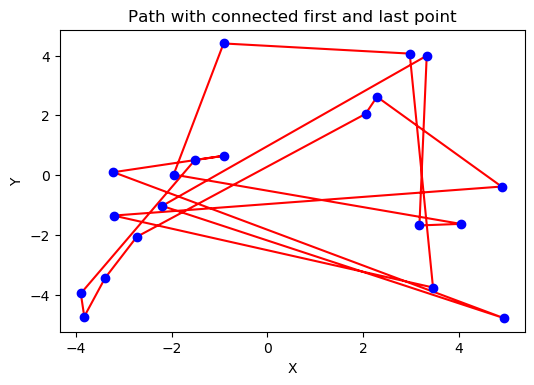

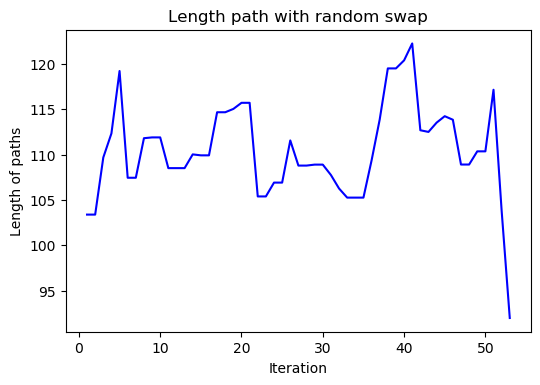

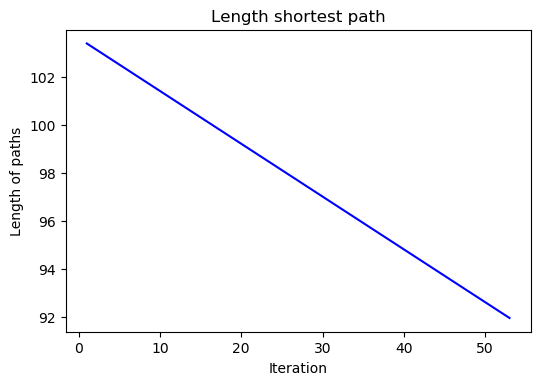

Path was shortened. No of iteration = 54	No of shortening path = 31	 Length of path = 89.96


<Figure size 1000x500 with 0 Axes>

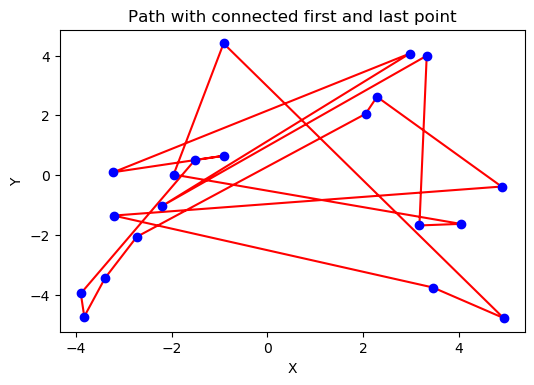

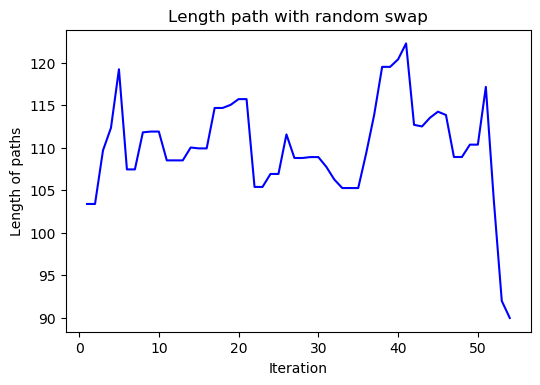

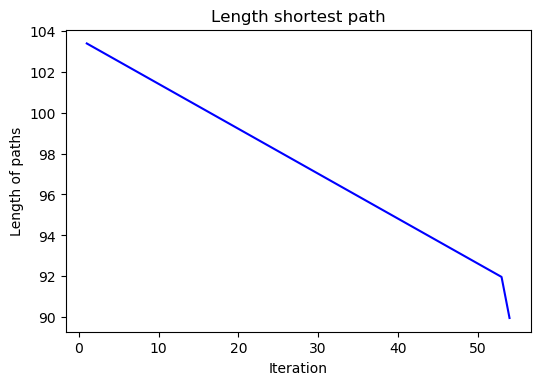

Path was shortened. No of iteration = 56	No of shortening path = 32	 Length of path = 88.53


<Figure size 1000x500 with 0 Axes>

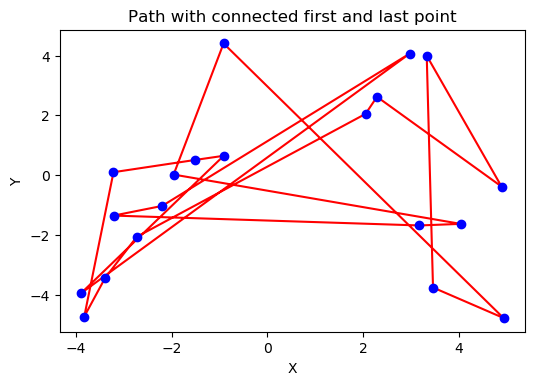

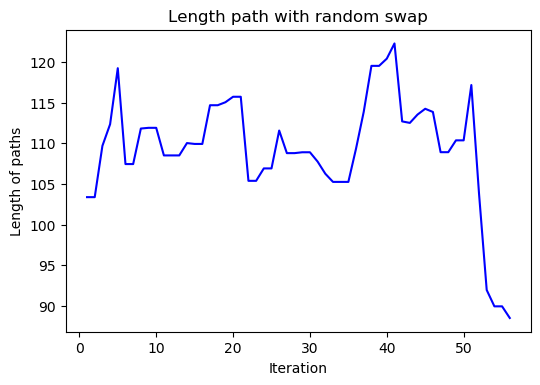

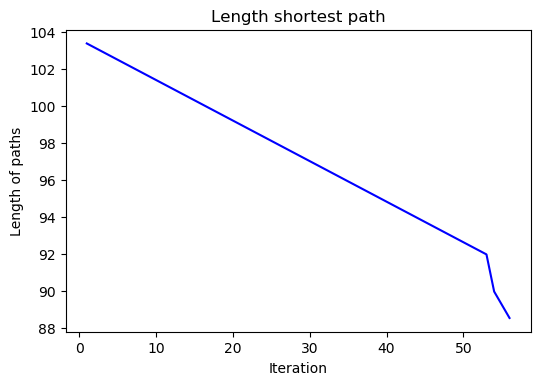

Path was shortened. No of iteration = 407	No of shortening path = 260	 Length of path = 88.50


<Figure size 1000x500 with 0 Axes>

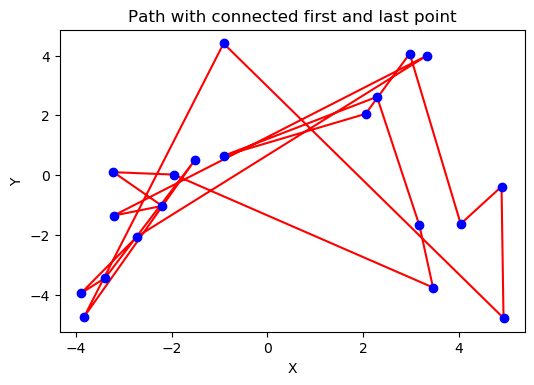

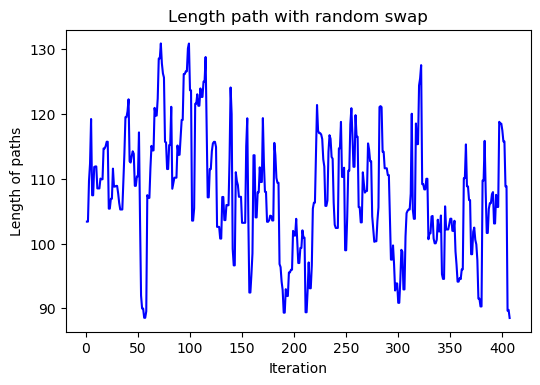

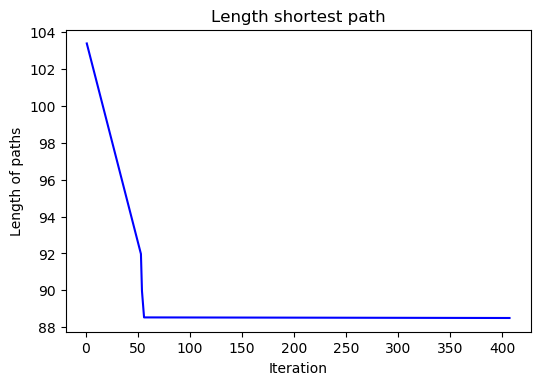

Path was shortened. No of iteration = 408	No of shortening path = 261	 Length of path = 83.06


<Figure size 1000x500 with 0 Axes>

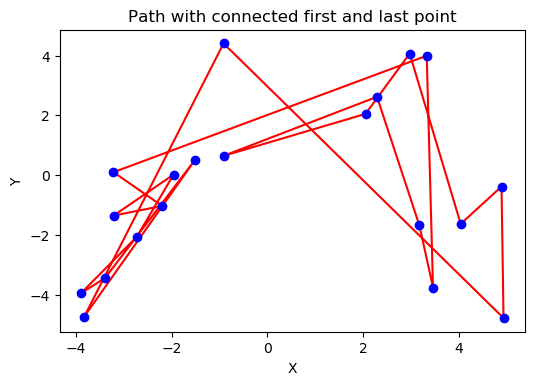

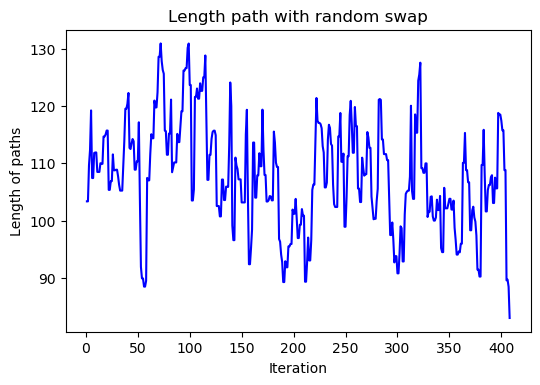

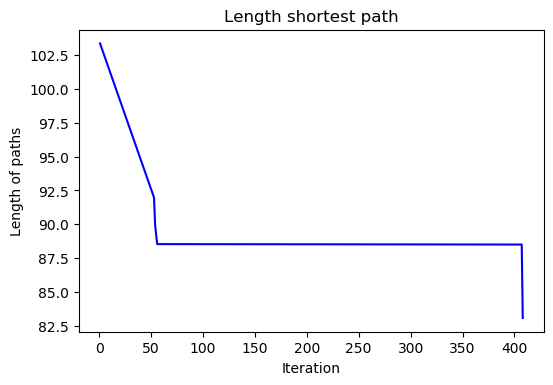

Path was shortened. No of iteration = 410	No of shortening path = 263	 Length of path = 80.86


<Figure size 1000x500 with 0 Axes>

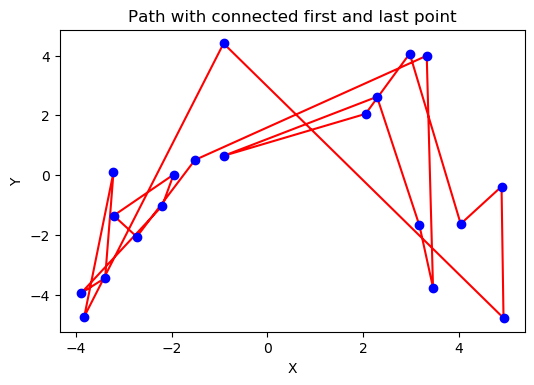

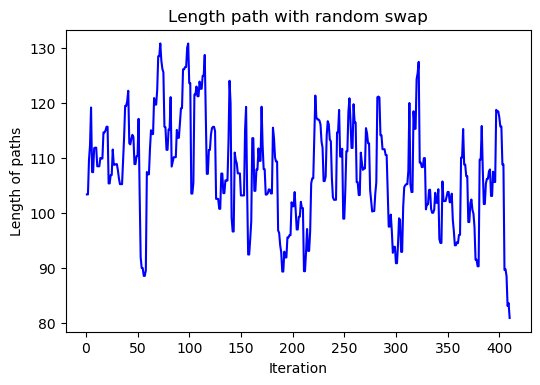

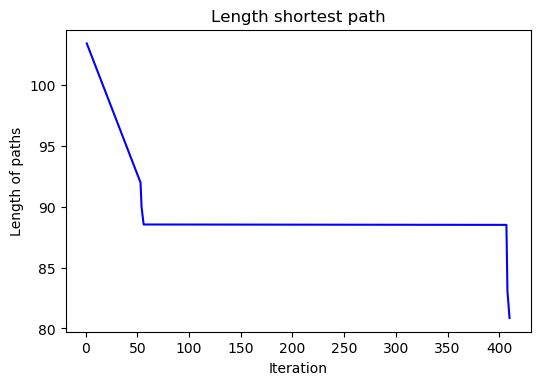

Path was shortened. No of iteration = 1088	No of shortening path = 650	 Length of path = 77.08


<Figure size 1000x500 with 0 Axes>

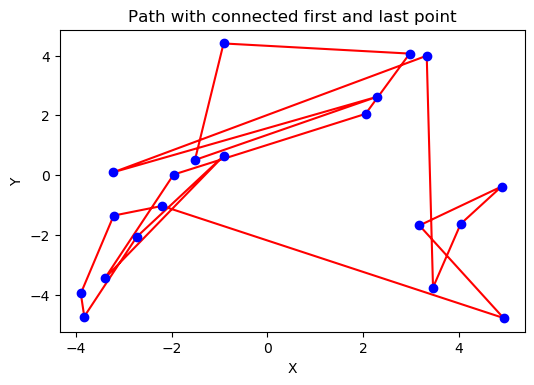

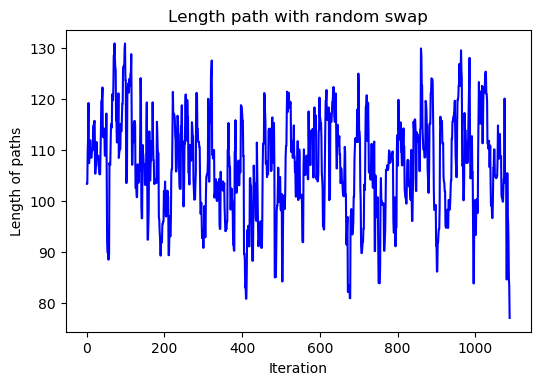

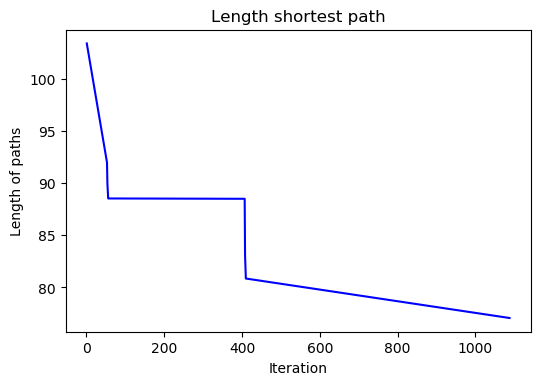

Path was shortened. No of iteration = 2182	No of shortening path = 1246	 Length of path = 73.64


/home/pawel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: overflow encountered in exp


<Figure size 1000x500 with 0 Axes>

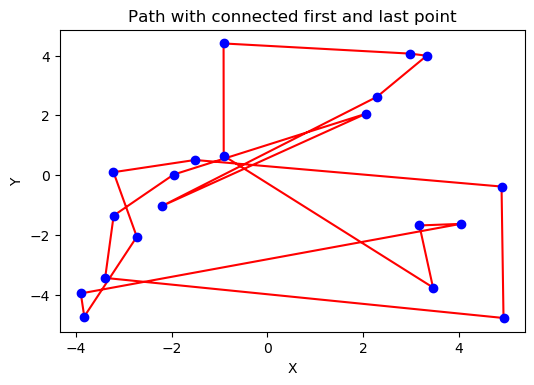

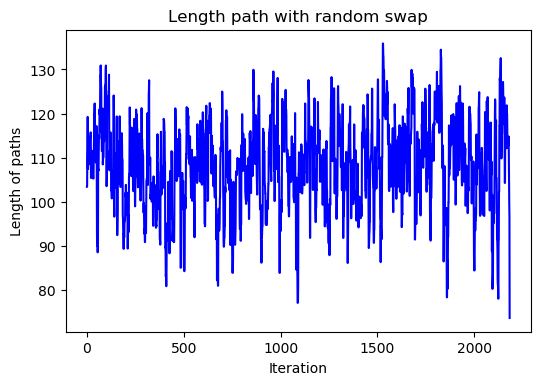

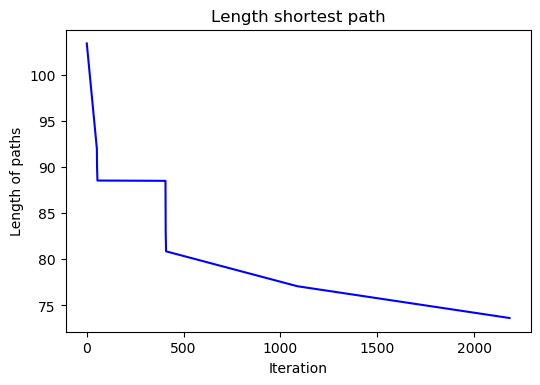

Path was shortened. No of iteration = 6559	No of shortening path = 3537	 Length of path = 72.77


<Figure size 1000x500 with 0 Axes>

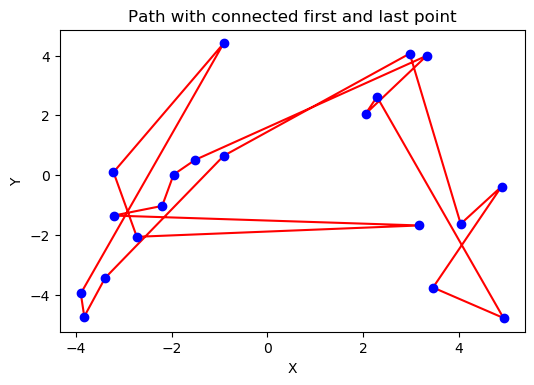

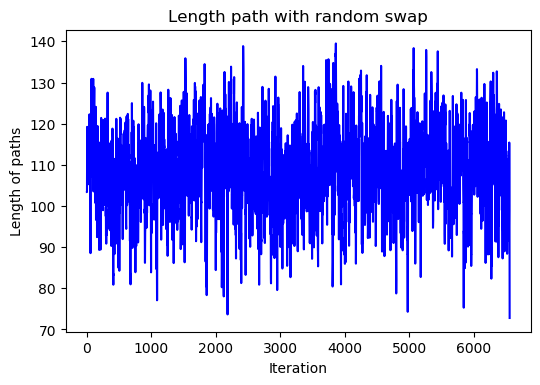

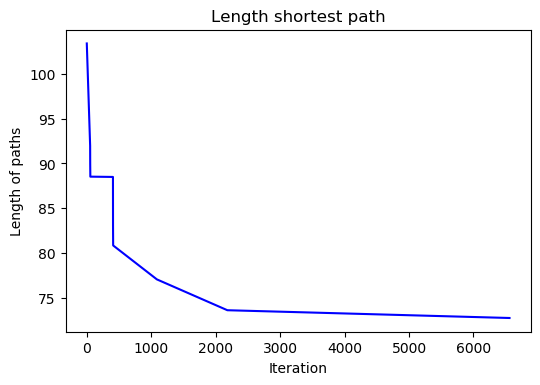

Path was shortened. No of iteration = 9887	No of shortening path = 5315	 Length of path = 68.63


<Figure size 1000x500 with 0 Axes>

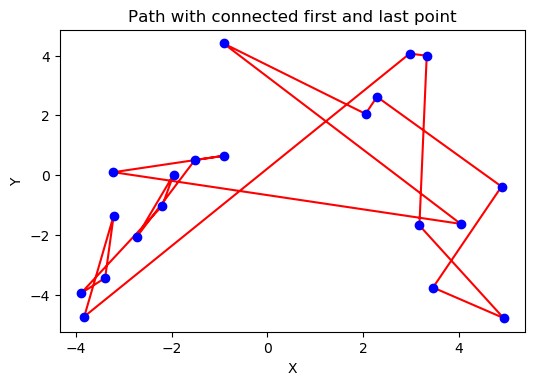

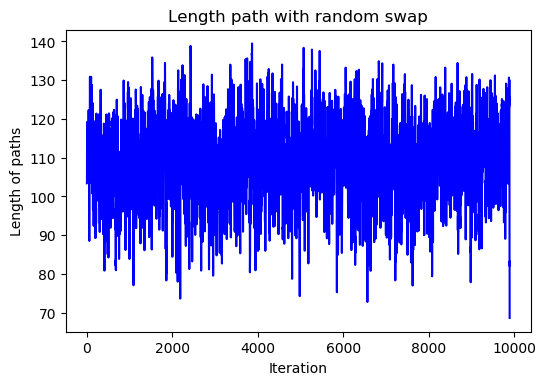

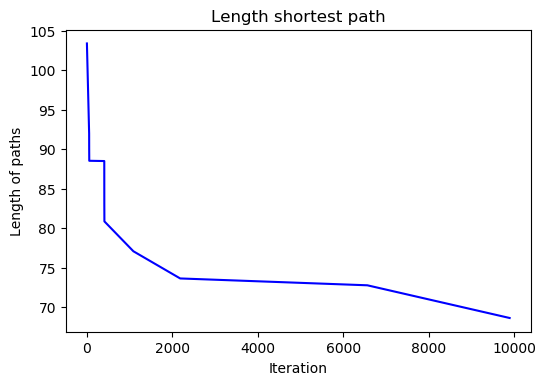

In [92]:
def plot_points(points):
    fig, ax1 = plt.subplots()
    
    ax1.set(xlabel = "X")
    ax1.set(ylabel = "Y")
    ax1.set_title("Path with connected first and last point")
    n = len(points)
    ax1.plot( np.append([points[i].x for i in range(n)], points[0].x), np.append([points[i].y for i in range(n)], points[0].y),  "r")
    ax1.plot( [points[i].x for i in range(n)],[points[i].y for i in range(n)] ,  "bo")
    plt.show()
    
def plot_path_lengths(energies_lenghts):
    fig, ax2 = plt.subplots()
    
    ax2.plot(np.arange(1, len(energies_lenghts) +1) ,energies_lenghts,  "b")
    ax2.set(xlabel = "Iteration")
    ax2.set(ylabel = "Length of paths")
    ax2.set_title("Length path with random swap")
    plt.show()
    
def plot_shortest_path_lengths(best_energies, iters):
    fit, ax3 = plt.subplots()
    
    ax3.plot(iters, best_energies, "b")
    ax3.set(xlabel = "Iteration")
    ax3.set(ylabel = "Length of paths")
    ax3.set_title("Length shortest path")
    plt.show()
    

def plot(points, energies_lenghts, best_energies, iters):
    plt.rcParams['figure.dpi'] = 100
    plt.figure(figsize=[10, 5])
    
    plot_points(points)
    plot_path_lengths(energies_lenghts)
    plot_shortest_path_lengths(best_energies, iters)



def simulated_annealing_length(func, no_of_iter, points):
    energy_min = float('inf')
    beta = 1.0
    n_accept = 0
    iter = 0
    energies_lenghts = np.array([])
    best_energies = np.array([])
    iters = np.array([])
    while iter < no_of_iter:
        iter += 1
        new_points, beta, n_accept, energy_min, new_path, old_energy = \
            swap_simulated_annealing_length(func, points[:], beta, n_accept, energy_min)
        energies_lenghts = np.append(energies_lenghts, old_energy)
        if new_path:
            print("Path was shortened. No of iteration = %d\tNo of shortening path = %d\t Length of path = %4.2f"
                  % (iter, n_accept, energy_min))
            best_energies = np.append(best_energies, energy_min)
            iters = np.append(iters, iter)
            plot(new_points, energies_lenghts, best_energies, iters)

points = generate_uniform_points(20, -5, 5, -5, 5)
simulated_annealing_length(arbitrary_swap, 10e3, points)


<h6>Wnioski</h6>
Funkcja simmulated-annealing czasami akceptuje zwiększającą funkcję celu z odpowiednim prawdopodobienśtwem

<h6>Wnioski ogólne</h6>
1.Funkcja pomaga rozwiązywac problemy NP-trunde których nie jest potrzebne rozwiązanie najbardziej optymalne, a wystarczy tylko dobre.<br>
2.Sprawdza się również gdy funkcja do zminimalizowania ma wiele lokalnych minimów